In [25]:
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
from sklearn.preprocessing import RobustScaler


# from sklearn.pipeline import Pipeline
# from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
# from sklearn.model_selection import train_test_split, StratifiedKFold, KFold
from sklearn.metrics import (roc_auc_score, recall_score, f1_score, precision_score,
                            accuracy_score)


import warnings; warnings.filterwarnings('ignore')


# Содержание
- [0. Используемые функции](#0.-Используемые-функции)
- [1. Загрузка и предобработка данных](#1.Загрузка-и-предобработка-данных)
- [2. EDA](#2.-EDA)
- [3. Модели поиска аномалий](#3.-Модели-поиска-аномалий)
    - [3.1 I-forest](#3.1-I-forest)
    - [3.2 Angle-base Outlier Detection](#3.2-Angle-base-Outlier-Detection)
    - [3.3 Clustering Based Local Outlier](#3.3-Clustering-Based-Local-Outlier)
    - [3.4 Connectivity Based Local Outlier](#3.4-Connectivity-Based-Local-Outlier)
    - [3.5 Histogram based Outlier Detection](#3.5-Histogram-based-Outlier-Detection)
    - [3.6 K-Nearest Neighbors Detector](#3.6-K-Nearest-Neighbors-Detector)
    - [3.7 Local Outlier Factor](#3.7-Local-Outlier-Factor)
    - [3.8 One class SVM detector](#3.8-One-class-SVM-detector)
    - [3.9 Principal Component Analysis](#3.9-Principal-Component-Analysis)
    - [3.10 Minimum Covariance Determinant](#3.10-Minimum-Covariance-Determinant)
    - [3.11 Subspace Outlier Detection](#3.11-Subspace-Outlier-Detection)
    - [3.12 Stochastic Outlier Selection](#3.12-Stochastic-Outlier-Selection)
- [4. Сравнение моделей](#4.-Сравнение-моделей)
    - [4.1 Сравнение моделей по другим скважинам](#4.1-Сравнение-моделей-по-другим-скважинам)
- [5. Выводы](#5.-Выводы)


# 0. Используемые функции
[Содержание](#Содержание)

In [26]:
# используемые функции



# определяем интервалы 2-сигма и 3-сигма
# def sigma_outline(y):
#     y_train_one_id = y
#     two_sigma = pd.Interval(left=float(y_train_one_id.mean() - 2 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 2 * y_train_one_id.std()),closed='both')
#     three_sigma = pd.Interval(left=float(y_train_one_id.mean() - 3 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 3 * y_train_one_id.std()),closed='both')
#     return two_sigma, three_sigma

# добавляем целевой признак аномалии  2-сигма и 3-сигма
def sigma_add(y):
    y_train_one_id = y
    two_sigma = pd.Interval(left=float(y_train_one_id.mean() - 2 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 2 * y_train_one_id.std()),closed='both')
    three_sigma = pd.Interval(left=float(y_train_one_id.mean() - 3 * y_train_one_id.std()), right=float(y_train_one_id.mean() + 3 * y_train_one_id.std()),closed='both')
    y['2sigma'] = [ 0 if x in two_sigma else 1 for x in y['targ_press_h']]
    y['3sigma'] = [ 0 if x in three_sigma else 1 for x in y['targ_press_h']]
    return print(f""" 2sigma outlined: {len(y[y['2sigma'] == 1])} of {len(y)} 
 3sigma outlined: {len(y[y['3sigma'] == 1])} of {len(y)}""")



    


# 1.Загрузка и предобработка данных
[Содержание](#Содержание)

In [27]:
data_raw = pd.read_csv('C:/Users/Peter/Documents/GitHub/project/cfp_dataset_v1.csv')

data_valid_raw = pd.read_csv('C:/Users/Peter/Documents/GitHub/project/cfp_dataset_v1_valid1.csv')

data_raw.drop(['Unnamed: 0','MIDUPT1138P2300058',
               'SHORTUPT1138P2300058', 'LONGUPT1138P2300058', 'T1013P500399'], axis=1, inplace=True)
data_valid_raw.drop(['Unnamed: 0','MIDUPT1138P2300058',
               'SHORTUPT1138P2300058', 'LONGUPT1138P2300058', 'T1013P500399'], axis=1, inplace=True)

data_raw.rename(columns={
    'T1138P6000096': "engine", 
 'T1138P6000315': "«engine_idle",
 'DMIDT1138P4000064': "workload_сh_d",
 'DSHORTT1138P4000064': "workload_сh_h",
 'DLONGT1138P4000064': "workload_сh_w",
 'DMIDT1138P2600012': "curr_сh_d",
 'DSHORTT1138P2600012': "curr_сh_h",
 'DLONGT1138P2600012': "curr_сh_w",
'DMIDT1205P2300000': "press_сh_d»",
 'DSHORTT1205P2300000': "press_сh_h»",
 'DLONGT1205P2300000': "press_сh_w",
'T1205P2300000': "press_coll",
 'T1138P4000064': "workload_eng",
 'T1138P2600012': "curr",
 'T1138P600050': "power_coef",
 'T1013P500399': "liq",
 'DMIDT1138P2300058': "targ_press_d",
 'DSHORTT1138P2300058': "targ_press_h",
 'DLONGT1138P2300058': "targ_press_w"
                  }, inplace=True)

data_raw.drop(['UUID','UNIXDT'], axis=1, inplace=True)

data_raw['DT'] = pd.to_datetime(data_raw['DT'])
data_valid_raw['DT'] = pd.to_datetime(data_valid_raw['DT'])


data_valid_raw.rename(columns={
    'T1138P6000096': "engine", 
 'T1138P6000315': "«engine_idle",
 'DMIDT1138P4000064': "workload_сh_d",
 'DSHORTT1138P4000064': "workload_сh_h",
 'DLONGT1138P4000064': "workload_сh_w",
 'DMIDT1138P2600012': "curr_сh_d",
 'DSHORTT1138P2600012': "curr_сh_h",
 'DLONGT1138P2600012': "curr_сh_w",
'DMIDT1205P2300000': "press_сh_d»",
 'DSHORTT1205P2300000': "press_сh_h»",
 'DLONGT1205P2300000': "press_сh_w",
'T1205P2300000': "press_coll",
 'T1138P4000064': "workload_eng",
 'T1138P2600012': "curr",
 'T1138P600050': "power_coef",
 'T1013P500399': "liq",
 'DMIDT1138P2300058': "targ_press_d",
 'DSHORTT1138P2300058': "targ_press_h",
 'DLONGT1138P2300058': "targ_press_w"
                  }, inplace=True)

data_valid_raw.drop(['UUID','UNIXDT'], axis=1, inplace=True)



#проверим пропуски
{key:data_raw[key].isna().sum() for key in data_raw.columns}




{'WELL_ID': 0,
 'DT': 0,
 'engine': 0,
 '«engine_idle': 0,
 'workload_сh_d': 0,
 'workload_сh_h': 0,
 'workload_сh_w': 0,
 'curr_сh_d': 0,
 'curr_сh_h': 0,
 'curr_сh_w': 0,
 'press_сh_d»': 0,
 'press_сh_h»': 0,
 'press_сh_w': 0,
 'press_coll': 1,
 'workload_eng': 0,
 'curr': 0,
 'power_coef': 0,
 'targ_press_d': 0,
 'targ_press_h': 0,
 'targ_press_w': 0}

In [28]:
#проверим пропуски валидации
{key:data_valid_raw[key].isna().sum() for key in data_raw.columns}

{'WELL_ID': 0,
 'DT': 0,
 'engine': 0,
 '«engine_idle': 0,
 'workload_сh_d': 0,
 'workload_сh_h': 0,
 'workload_сh_w': 0,
 'curr_сh_d': 0,
 'curr_сh_h': 0,
 'curr_сh_w': 0,
 'press_сh_d»': 0,
 'press_сh_h»': 0,
 'press_сh_w': 0,
 'press_coll': 0,
 'workload_eng': 0,
 'curr': 0,
 'power_coef': 0,
 'targ_press_d': 0,
 'targ_press_h': 0,
 'targ_press_w': 0}

'T1138P6000096': "Наработка двигателя с момента последнего включения, сек"  **engine**  
'T1138P6000315': "«Время простоя двигателя с момента последнего выключения, сек", **engine_idle**    
'DMIDT1138P4000064': "Средняя скорость изменения загрузки двигателя СУТ, %/час",  **workload_сh_d**  
'DSHORTT1138P4000064': "Средняя скорость изменения загрузки двигателя ЧАС, %/час",  **workload_сh_h**  
'DLONGT1138P4000064': "Средняя скорость изменения загрузки двигателя НЕДЕЛЯ, %/час",  **workload_сh_w**  
'DMIDT1138P2600012': "Средняя скорость изменения тока фазы A двигателя в СУТ, А/час",  **curr_сh_d**  
'DSHORTT1138P2600012': "Средняя скорость изменения тока фазы A двигателя в ЧАС, А/час",  **curr_сh_h**  
'DLONGT1138P2600012': "Средняя скорость изменения тока фазы A двигателя в НЕДЕЛЯ, А/час", **curr_сh_w**   
'DMIDT1205P2300000': "Средняя скорость изменения давления в коллекторе ИУ в СУТ, МПа/час»", **press_сh_d**   
'DSHORTT1205P2300000': "Средняя скорость изменения давления в коллекторе ИУ в ЧАС, МПа/час»",  **press_сh_h**  
'DLONGT1205P2300000': "Средняя скорость изменения давления в коллекторе ИУ в НЕДЕЛЯ, МПа/час»",  **press_сh_w**  
'T1205P2300000': "Давление в коллекторе измерительной установки, МПа",  **press_coll**  
'T1138P4000064': "Загрузка двигателя, %",  **workload_eng**  
'T1138P2600012': "Ток фазы A двигателя, А",  **curr**  
'T1138P600050': "Коэффициент мощности (cos fi)",  **power_coef**  
'T1013P500399': "Объём жидкости в рабочих условиях за время наработки суточный, м3",  **liq**  
'DMIDT1138P2300058': "Target - Средняя скорость изменения давления на приеме насоса в СУТ, МПа/час", **targ_press_d**   
'DSHORTT1138P2300058': "Target - Средняя скорость изменения давления на приеме насоса в ЧАС, МПа/час",  **targ_press_h**  
'DLONGT1138P2300058': "Target - Средняя скорость изменения давления на приеме насоса НЕДЕЛЯ, МПа/час"  **targ_press_w**  

<AxesSubplot:>

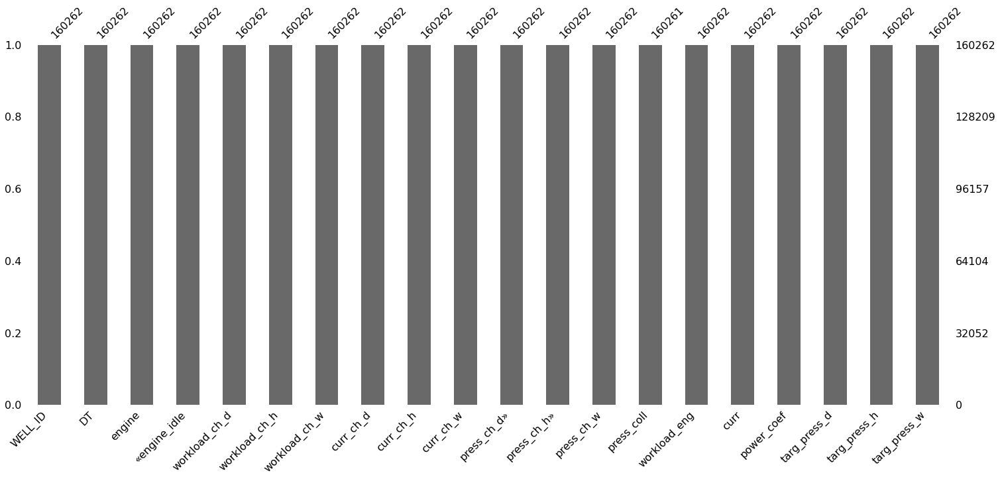

In [29]:
#выводим данные на график, чтобы визуально просмотреть наличие пропусков и сколько пропусков в данных
msno.bar(data_raw)

In [30]:
# увидели что пропущено только одно значение, заполним его средним
median_press = data_raw['press_coll'].median()
data_raw['press_coll'].fillna(median_press, inplace=True)

In [31]:
wells = list(set(data_raw['WELL_ID']))
wells

[226003330,
 226003074,
 226002627,
 226002307,
 226002148,
 226000198,
 226003080,
 226000297,
 226002603,
 226002861,
 226002416,
 226003316,
 226002998,
 226001846,
 226001947,
 226000188,
 226002142]

In [32]:
# дальше работаем с входными данными, преобразовывая их для удобства дальнейшей обработки

data_prep = data_raw.copy()
data_valid_prep = data_valid_raw.copy()

data_prep['hour'] = data_prep['DT'].dt.hour
data_prep['day_w'] = data_prep['DT'].dt.dayofweek
data_prep['minute'] = data_prep['DT'].dt.minute


data_valid_prep['hour'] = data_valid_prep['DT'].dt.hour
data_valid_prep['day_w'] = data_valid_prep['DT'].dt.dayofweek
data_valid_prep['minute'] = data_valid_prep['DT'].dt.minute


data_prep.set_index(['WELL_ID','DT'],inplace=True)
data_valid_prep.set_index(['WELL_ID','DT'],inplace=True)

data_prep = data_prep.sort_index()
data_valid_prep = data_valid_prep.sort_index()

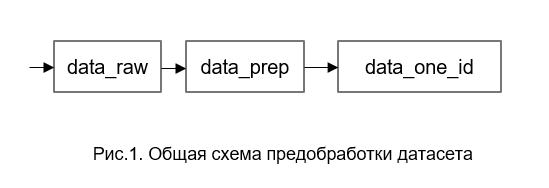

In [177]:
data_lenght = []
for well in wells:
    data_lenght.append(len(data_prep.xs(well, level='WELL_ID'))) 
data_lenght

[9990,
 9578,
 9992,
 9607,
 3180,
 9981,
 9600,
 9998,
 9706,
 9987,
 9982,
 9987,
 8725,
 9990,
 9987,
 9975,
 9997]

In [33]:
data_one_id = data_prep.xs(226000188, level='WELL_ID')
data_one_id = data_one_id.drop(['targ_press_d','targ_press_h','targ_press_w'],axis=1)

data_one_id_valid = data_valid_prep.xs(226000188, level='WELL_ID')
data_one_id_valid = data_one_id_valid.drop(['targ_press_d','targ_press_h','targ_press_w'],axis=1)

data_one_id

,engine,«engine_idle,workload_сh_d,workload_сh_h,workload_сh_w,curr_сh_d,curr_сh_h,curr_сh_w,press_сh_d»,press_сh_h»,press_сh_w,press_coll,workload_eng,curr,power_coef,hour,day_w,minute
DT,,,,,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,13200,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.648583,0,0.000000,0.000,6,3,40
2019-06-27 06:45:00,0,13500,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.681818,0,0.000000,0.000,6,3,45
2019-06-27 06:50:00,0,13800,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.650049,0,0.000000,0.000,6,3,50
2019-06-27 06:55:00,0,14100,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.648583,0,0.000000,0.000,6,3,55
2019-06-27 07:00:00,0,14400,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.642718,0,0.000000,0.000,7,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,3000,0,-5.609132,-21.079881,-4.387931,-0.611832,-2.678454,-0.518866,0.015839,0.007317,0.006937,1.514174,46,18.299999,0.554,23,2,35
2019-07-31 23:40:00,3300,0,-5.553041,-18.971893,-4.383543,-0.617713,-2.530606,-0.519547,0.015916,0.008931,0.006953,1.516129,46,18.200001,0.554,23,2,40
2019-07-31 23:45:00,3600,0,-5.617511,-18.274703,-4.391160,-0.611536,-2.277545,-0.519028,0.015757,0.008038,0.006946,1.516129,45,18.200001,0.541,23,2,45


In [34]:
data_one_id.index[0]

Timestamp('2019-06-27 06:40:00')

In [35]:
data_one_id.index[-1]

Timestamp('2019-07-31 23:55:00')

In [36]:
data_one_id_valid

,engine,«engine_idle,workload_сh_d,workload_сh_h,workload_сh_w,curr_сh_d,curr_сh_h,curr_сh_w,press_сh_d»,press_сh_h»,press_сh_w,press_coll,workload_eng,curr,power_coef,hour,day_w,minute
DT,,,,,,,,,,,,,,,,,,
2019-06-20 08:00:00,0,17700,-3.137725,0.000000,-4.222888,-0.470845,0.000000,-0.768889,0.000104,0.000000,-0.000948,1.582111,0,0.000000,0.000,8,3,0
2019-06-20 08:05:00,0,18000,-3.137725,0.000000,-4.222888,-0.470845,0.000000,-0.768889,0.000104,0.000000,-0.000948,1.580645,0,0.000000,0.000,8,3,5
2019-06-20 08:10:00,0,18300,-3.137725,0.000000,-4.222888,-0.470845,0.000000,-0.768889,0.000104,0.000000,-0.000948,1.572825,0,0.000000,0.000,8,3,10
2019-06-20 08:15:00,0,18600,-3.137725,0.000000,-4.222888,-0.470845,0.000000,-0.768889,0.000104,0.000000,-0.000948,1.566960,0,0.000000,0.000,8,3,15
2019-06-20 08:20:00,0,18900,-3.137725,0.000000,-4.222888,-0.470845,0.000000,-0.768889,0.000104,0.000000,-0.000948,1.567937,0,0.000000,0.000,8,3,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-06-26 02:30:00,12600,0,-3.324676,2.289577,-4.150006,-0.397189,0.281226,-0.667456,0.003264,0.015107,0.000059,1.561584,49,18.900000,0.568,2,2,30
2019-06-26 02:35:00,12900,0,-3.291429,2.060620,-4.145856,-0.405217,0.133103,-0.667989,0.003407,0.015356,0.000076,1.563050,49,18.799999,0.567,2,2,35
2019-06-26 02:40:00,13200,0,-3.258515,1.854558,-4.141710,-0.389165,0.239794,-0.666121,0.003490,0.014993,0.000088,1.564027,49,18.900000,0.568,2,2,40


# 2. EDA
[Содержание](#Содержание)

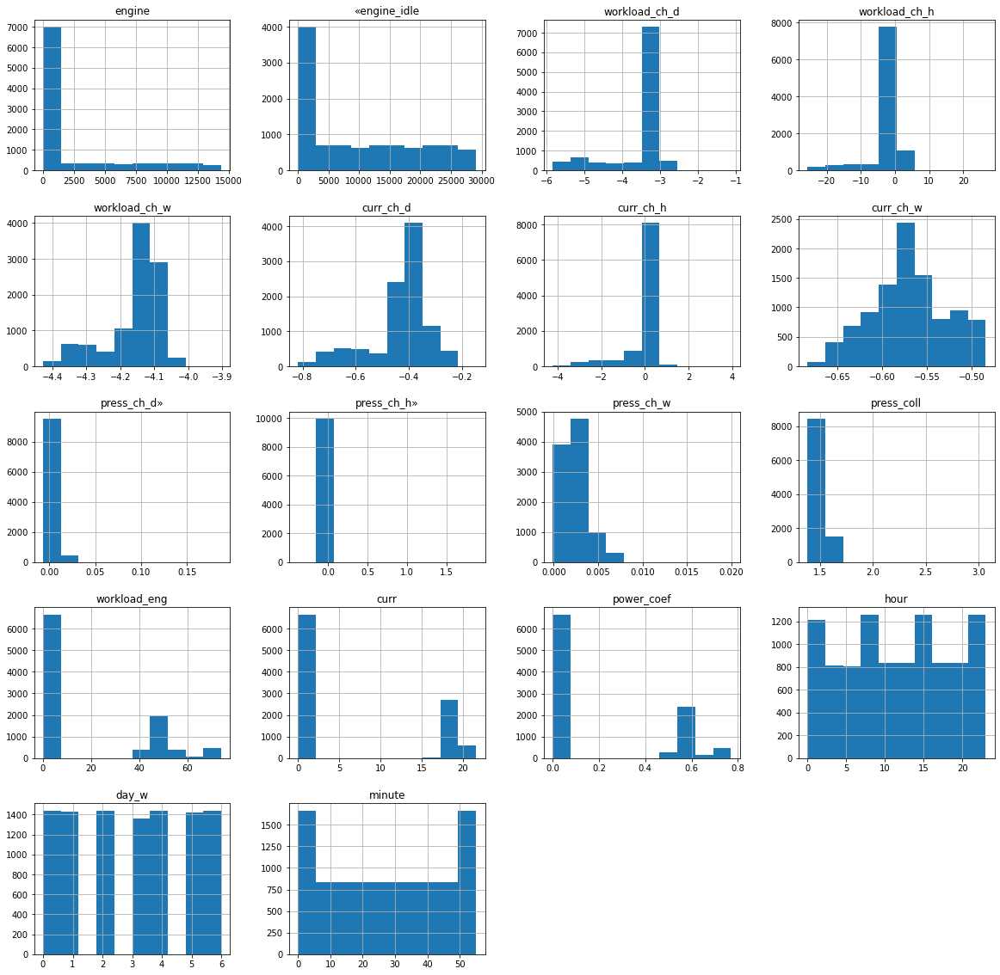

In [37]:
data_one_id.hist(figsize=(20, 20));


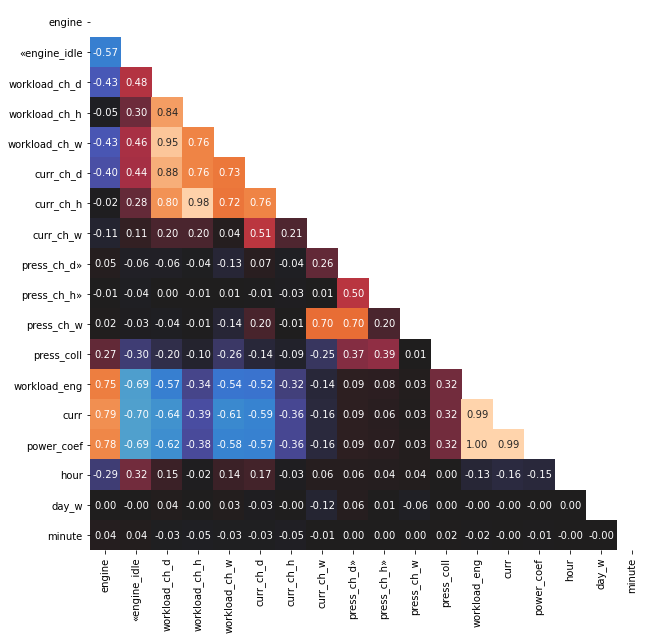

In [38]:
plt.figure(figsize=(10,10))

corr_matrix = data_one_id.corr()
lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k=-1).astype(np.bool))

sns.heatmap(lower, annot=True, fmt='.2f', cbar=False, center=0);

In [39]:
high_corr = [
    column for column in lower.columns if any((lower[column] > 0.6)|(lower[column] < -0.6))
]
high_corr

['engine',
 '«engine_idle',
 'workload_сh_d',
 'workload_сh_h',
 'workload_сh_w',
 'curr_сh_d',
 'curr_сh_w',
 'press_сh_d»',
 'workload_eng',
 'curr']

In [40]:
other_features = [col for col in data_one_id.columns if col not in high_corr and col!='quality']


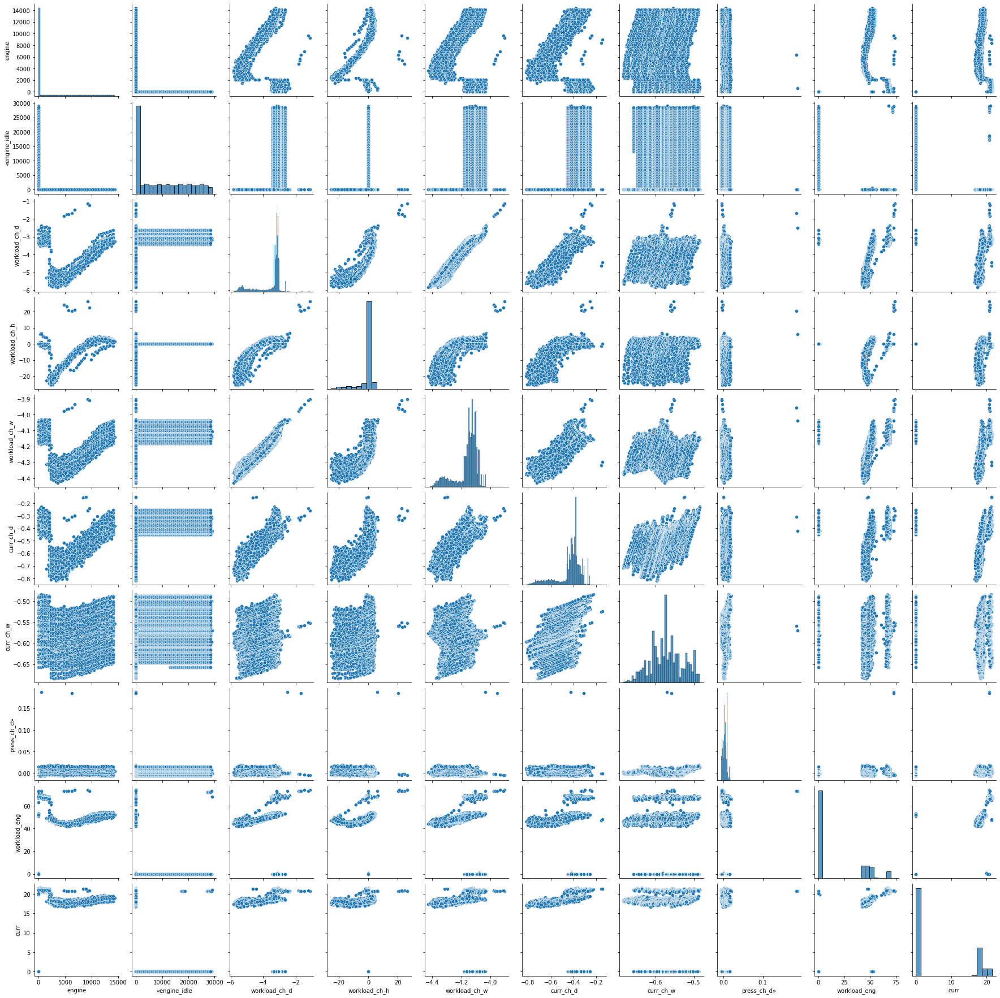

In [41]:
sns.pairplot(data_one_id[high_corr])


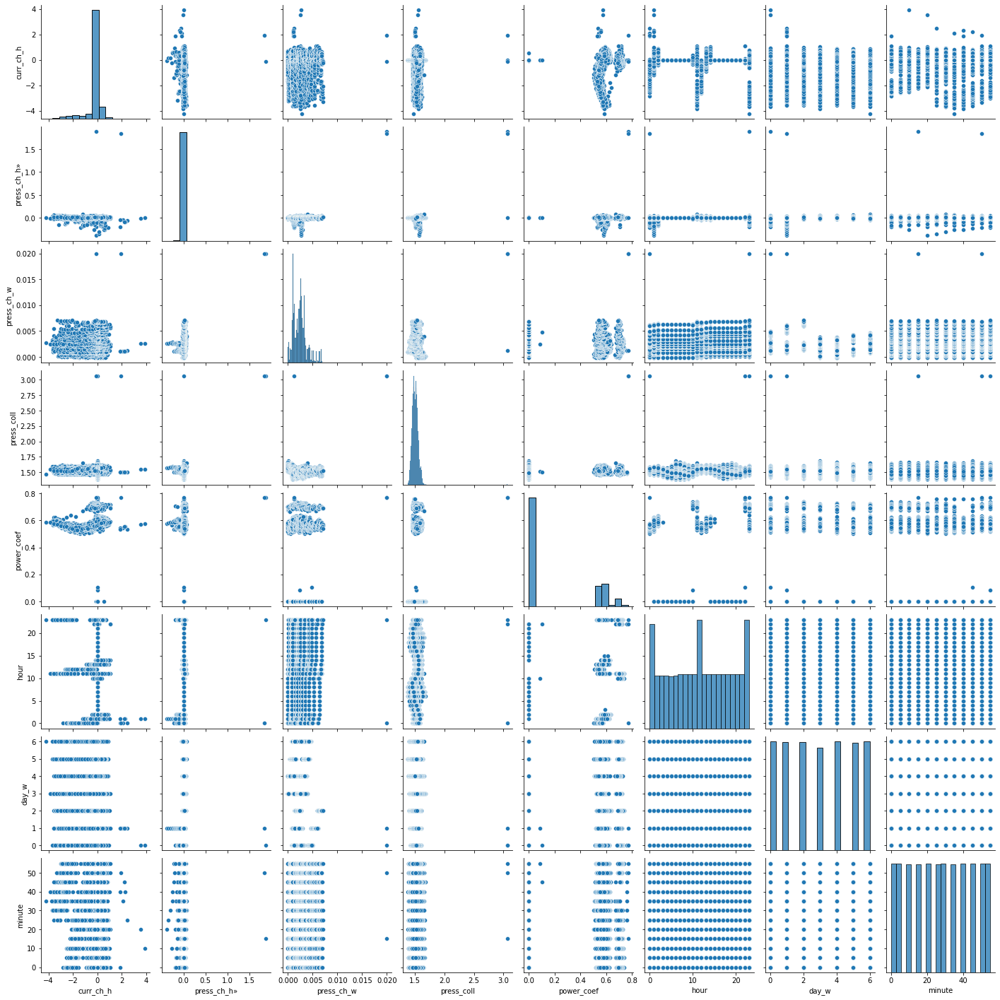

In [42]:
sns.pairplot(data_one_id[other_features])

## 3. Модели поиска аномалий
[Содержание](#Содержание)

## 3.1 I-forest

Основная идея - пробуем "изолировать" наблюдение от всех остальных, и посмотреть насколько это легко можно сделать. Если слишком легко, то, скорее всего наблюдение лежит далеко и является выбросом. Если очень тяжело - скорее всего она похожа на многие другие точки и выбросом не является.


[Isolation-based Anomaly Detection//Fei Tony Liu and Kai Ming Ting//Gippsland School of Information Technology Monash University]

In [43]:
# init setup
from pycaret.anomaly import *
s = setup(data_one_id, session_id = 123)

,Description,Value
0,session_id,123
1,Original Data,"(9975, 18)"
2,Missing Values,False
3,Numeric Features,16
4,Categorical Features,2
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(9975, 35)"
9,CPU Jobs,-1


In [44]:
# check list of available models
models()

,Name,Reference
ID,,
abod,Angle-base Outlier Detection,pyod.models.abod.ABOD
cluster,Clustering-Based Local Outlier,pyod.models.cblof.CBLOF
cof,Connectivity-Based Local Outlier,pyod.models.cof.COF
iforest,Isolation Forest,pyod.models.iforest.IForest
histogram,Histogram-based Outlier Detection,pyod.models.hbos.HBOS
knn,K-Nearest Neighbors Detector,pyod.models.knn.KNN
lof,Local Outlier Factor,pyod.models.lof.LOF
svm,One-class SVM detector,pyod.models.ocsvm.OCSVM
pca,Principal Component Analysis,pyod.models.pca.PCA


In [45]:
# train model iforest
iforest = create_model('iforest', fraction = 0.1)
iforest_results = assign_model(iforest)
iforest_results.head()

,engine,«engine_idle,workload_сh_d,workload_сh_h,workload_сh_w,curr_сh_d,curr_сh_h,curr_сh_w,press_сh_d»,press_сh_h»,press_сh_w,press_coll,workload_eng,curr,power_coef,hour,day_w,minute,Anomaly,Anomaly_Score
DT,,,,,,,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,13200,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.648583,0,0.0,0.0,6,3,40,0,-0.058549
2019-06-27 06:45:00,0,13500,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.681818,0,0.0,0.0,6,3,45,0,-0.041751
2019-06-27 06:50:00,0,13800,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.650049,0,0.0,0.0,6,3,50,0,-0.042139
2019-06-27 06:55:00,0,14100,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.648583,0,0.0,0.0,6,3,55,0,-0.053553
2019-06-27 07:00:00,0,14400,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.642718,0,0.0,0.0,7,3,0,0,-0.036183


In [46]:
# check anomalies
iforest_results[iforest_results['Anomaly'] == 1].head()

,engine,«engine_idle,workload_сh_d,workload_сh_h,workload_сh_w,curr_сh_d,curr_сh_h,curr_сh_w,press_сh_d»,press_сh_h»,press_сh_w,press_coll,workload_eng,curr,power_coef,hour,day_w,minute,Anomaly,Anomaly_Score
DT,,,,,,,,,,,,,,,,,,,,
2019-06-27 11:00:00,0,0,-3.232999,0.000000,-4.138484,-0.423734,0.000000,-0.656976,0.001927,0.000000,0.000129,1.607038,68,21.100000,0.706,11,3,0,1,0.006732
2019-06-27 11:20:00,1200,0,-3.222042,-0.874800,-4.133919,-0.394680,0.152521,-0.653148,0.002892,0.009069,0.000234,1.615836,67,21.200001,0.690,11,3,20,1,0.001738
2019-06-27 11:40:00,2400,0,-5.490316,-24.128756,-4.357360,-0.690296,-2.942892,-0.681731,0.000917,-0.011342,0.000045,1.600195,47,18.600000,0.558,11,3,40,1,0.040526
2019-06-27 11:45:00,2700,0,-5.555413,-22.915881,-4.365003,-0.707393,-2.888603,-0.683449,0.003078,0.011493,0.000262,1.618279,46,18.400000,0.550,11,3,45,1,0.057119
2019-06-27 11:50:00,3000,0,-5.499859,-20.624293,-4.360638,-0.712319,-2.719743,-0.683966,0.000877,-0.011357,0.000045,1.600195,46,18.299999,0.550,11,3,50,1,0.041798


In [47]:
result_score = pd.DataFrame(index = iforest_results.index)
result_score['iforest_an'] = iforest_results['Anomaly']
result_score['iforest_an_sc'] = iforest_results['Anomaly_Score']
result_score 

,iforest_an,iforest_an_sc
DT,,
2019-06-27 06:40:00,0,-0.058549
2019-06-27 06:45:00,0,-0.041751
2019-06-27 06:50:00,0,-0.042139
2019-06-27 06:55:00,0,-0.053553
2019-06-27 07:00:00,0,-0.036183
...,...,...
2019-07-31 23:35:00,1,0.065181
2019-07-31 23:40:00,1,0.055687
2019-07-31 23:45:00,1,0.056535


In [48]:
data_features = data_one_id.copy()

scaler = RobustScaler()
scaled_data = pd.DataFrame(
    data=scaler.fit_transform(data_features), 
    columns=data_features.columns
)

In [49]:
# Визуализация датасета  при помощи t-SNE.
from sklearn.manifold import TSNE
tsne = TSNE(random_state=17)
X_tsne = tsne.fit_transform(scaled_data)


Text(0.5, 1.0, 'Scatterplot of I-forest Anomaly Score')

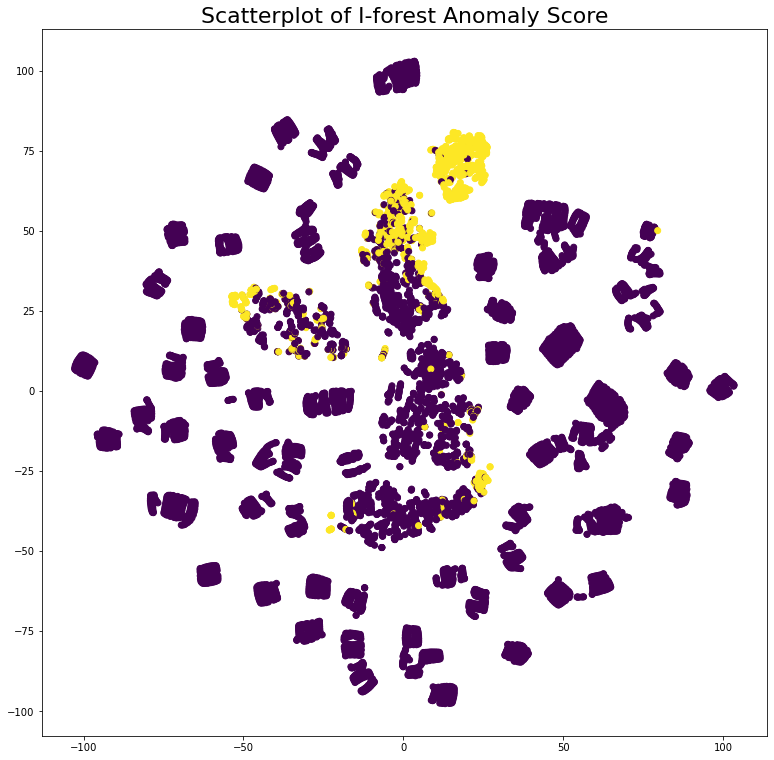

In [50]:
plt.figure(figsize=(13, 13))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=iforest_results['Anomaly']);
plt.title("Scatterplot of I-forest Anomaly Score", fontsize=22)

## 3.2 Angle-base Outlier Detection
[Содержание](#Содержание)

Основная идея - Есть кластер точек. Если точки находятся внутри этого условного кластера, то угол между векторами связывающего данную точку попарно с другими постоянно меняется в зависимости от выбранных точке. Если же точка лежит вне кластера, то перебирая точки угол между векторами меняется незначительно.



[Angle-Based Outlier Detection in High-dimensional Data//Hans-Peter Kriegel, Matthias Schubert, Arthur Zimek//Ludwig-Maximilians-Universität München//in Proc. of the 14th ACM SIGKDD International Conference on Knowledge Discovery & Data Mining (KDD'08), Las Vegas, NV, 2008,pp. 444-452.]

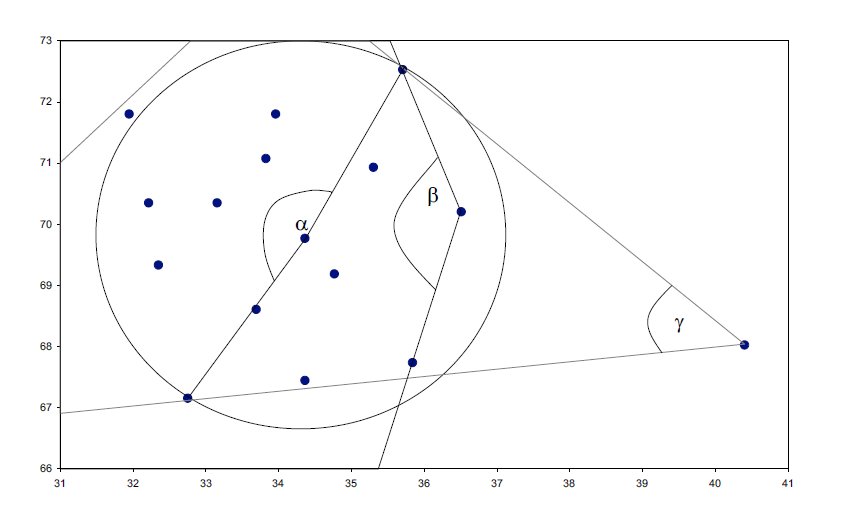

In [51]:
# train model abod
abod = create_model('abod', fraction = 0.1)
abod_results = assign_model(abod)

In [52]:
# check anomalies abod
abod_results[abod_results['Anomaly'] == 1].head()

,engine,«engine_idle,workload_сh_d,workload_сh_h,workload_сh_w,curr_сh_d,curr_сh_h,curr_сh_w,press_сh_d»,press_сh_h»,press_сh_w,press_coll,workload_eng,curr,power_coef,hour,day_w,minute,Anomaly,Anomaly_Score
DT,,,,,,,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,13200,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.648583,0,0.0,0.0,6,3,40,1,-0.001079
2019-06-27 06:50:00,0,13800,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.650049,0,0.0,0.0,6,3,50,1,-0.000992
2019-06-27 06:55:00,0,14100,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.648583,0,0.0,0.0,6,3,55,1,-0.001062
2019-06-27 07:00:00,0,14400,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.642718,0,0.0,0.0,7,3,0,1,-0.000991
2019-06-27 07:05:00,0,14700,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.661290,0,0.0,0.0,7,3,5,1,-0.001016


In [53]:
result_score['abod_an'] = abod_results['Anomaly']
result_score['abod_an_sc'] = abod_results['Anomaly_Score']
result_score

,iforest_an,iforest_an_sc,abod_an,abod_an_sc
DT,,,,
2019-06-27 06:40:00,0,-0.058549,1,-0.001079
2019-06-27 06:45:00,0,-0.041751,0,-0.005680
2019-06-27 06:50:00,0,-0.042139,1,-0.000992
2019-06-27 06:55:00,0,-0.053553,1,-0.001062
2019-06-27 07:00:00,0,-0.036183,1,-0.000991
...,...,...,...,...
2019-07-31 23:35:00,1,0.065181,0,-0.003459
2019-07-31 23:40:00,1,0.055687,0,-0.004642
2019-07-31 23:45:00,1,0.056535,0,-0.003130


Text(0.5, 1.0, 'Scatterplot of ABOD Anomaly Score')

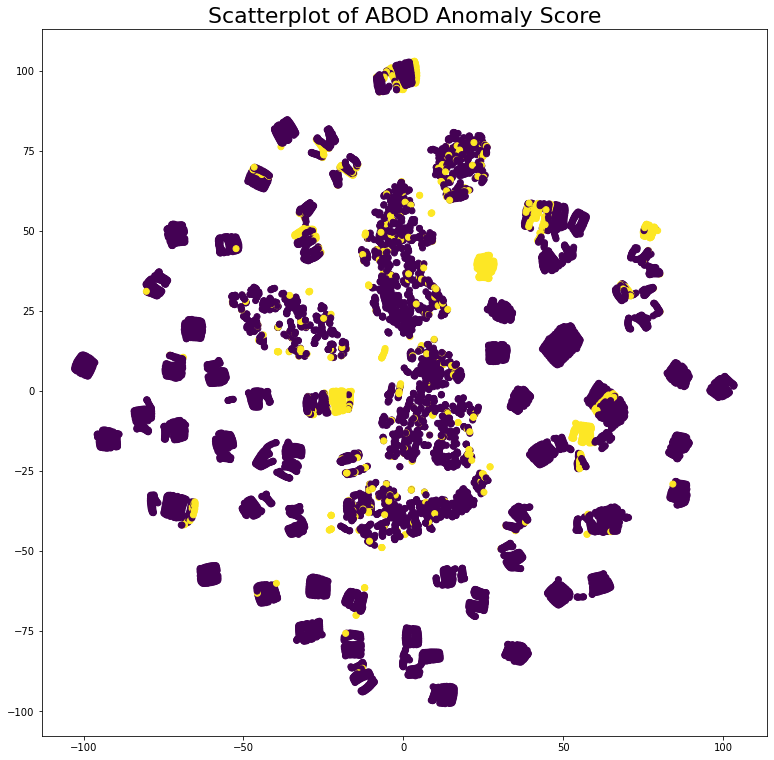

In [54]:
plt.figure(figsize=(13, 13))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=abod_results['Anomaly'])
plt.title("Scatterplot of ABOD Anomaly Score", fontsize=22)

## 3.3 Clustering-Based Local Outlier
[Содержание](#Содержание)

Основная идея - разбить данные на кластеры (на основании алгоритма К-средних), отранжировать на большие и малые кластеры, и для каждой точки из малого кластера потом посчитаем расстояние до ближайшего большого и на основании этого составим счет (anomaly score) и примем решение - аномалия точка или нет.


[Discovering Cluster ]

In [55]:
# train model abod
cluster = create_model('cluster', fraction = 0.1)
cluster_results = assign_model(cluster)

In [56]:
# check anomalies
cluster_results[cluster_results['Anomaly'] == 1].head()

,engine,«engine_idle,workload_сh_d,workload_сh_h,workload_сh_w,curr_сh_d,curr_сh_h,curr_сh_w,press_сh_d»,press_сh_h»,press_сh_w,press_coll,workload_eng,curr,power_coef,hour,day_w,minute,Anomaly,Anomaly_Score
DT,,,,,,,,,,,,,,,,,,,,
2019-06-27 07:40:00,0,16800,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.654937,0,0.0,0.0,7,3,40,1,1800.348511
2019-06-27 08:40:00,0,20400,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.624145,0,0.0,0.0,8,3,40,1,1799.673218
2019-06-27 08:45:00,0,20700,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.624145,0,0.0,0.0,8,3,45,1,1950.019775
2019-06-27 09:50:00,0,24600,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.601173,0,0.0,0.0,9,3,50,1,1950.000854
2019-06-27 09:55:00,0,24900,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.590909,0,0.0,0.0,9,3,55,1,1808.575928


In [57]:
result_score['cluster_an'] = cluster_results['Anomaly']
result_score['cluster_an_sc'] = cluster_results['Anomaly_Score']

Text(0.5, 1.0, 'Scatterplot of Clustering-Based Local Outlier')

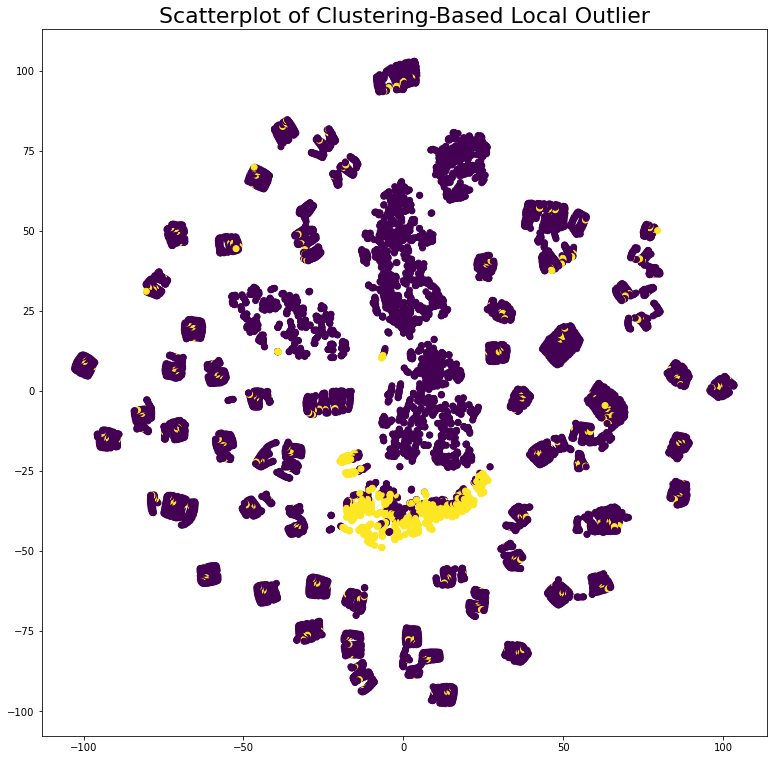

In [58]:
plt.figure(figsize=(13, 13))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=cluster_results['Anomaly'])
plt.title("Scatterplot of Clustering-Based Local Outlier", fontsize=22)

## 3.4 Connectivity-Based Local Outlier
[Содержание](#Содержание)

In [59]:
# train model iforest
cof = create_model('cof', fraction = 0.1)
cof_results = assign_model(cof)
cof_results.head()

,engine,«engine_idle,workload_сh_d,workload_сh_h,workload_сh_w,curr_сh_d,curr_сh_h,curr_сh_w,press_сh_d»,press_сh_h»,press_сh_w,press_coll,workload_eng,curr,power_coef,hour,day_w,minute,Anomaly,Anomaly_Score
DT,,,,,,,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,13200,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.648583,0,0.0,0.0,6,3,40,0,1.053664
2019-06-27 06:45:00,0,13500,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.681818,0,0.0,0.0,6,3,45,0,1.047839
2019-06-27 06:50:00,0,13800,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.650049,0,0.0,0.0,6,3,50,0,1.051901
2019-06-27 06:55:00,0,14100,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.648583,0,0.0,0.0,6,3,55,0,1.045006
2019-06-27 07:00:00,0,14400,-3.232999,0.0,-4.138484,-0.423734,0.0,-0.656976,0.001927,0.0,0.000129,1.642718,0,0.0,0.0,7,3,0,0,1.061451


In [60]:
result_score['cof_an'] = cof_results['Anomaly']
result_score['cof_an_sc'] = cof_results['Anomaly_Score']
result_score

,iforest_an,iforest_an_sc,abod_an,abod_an_sc,cluster_an,cluster_an_sc,cof_an,cof_an_sc
DT,,,,,,,,
2019-06-27 06:40:00,0,-0.058549,1,-0.001079,0,1650.015503,0,1.053664
2019-06-27 06:45:00,0,-0.041751,0,-0.005680,0,1350.018555,0,1.047839
2019-06-27 06:50:00,0,-0.042139,1,-0.000992,0,1050.023315,0,1.051901
2019-06-27 06:55:00,0,-0.053553,1,-0.001062,0,750.031738,0,1.045006
2019-06-27 07:00:00,0,-0.036183,1,-0.000991,0,450.038269,0,1.061451
...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,1,0.065181,0,-0.003459,0,891.844727,0,1.005982
2019-07-31 23:40:00,1,0.055687,0,-0.004642,0,591.878052,0,1.004103
2019-07-31 23:45:00,1,0.056535,0,-0.003130,0,291.999573,0,0.974309


Text(0.5, 1.0, 'Scatterplot of Connectivity-Based Local Outlier')

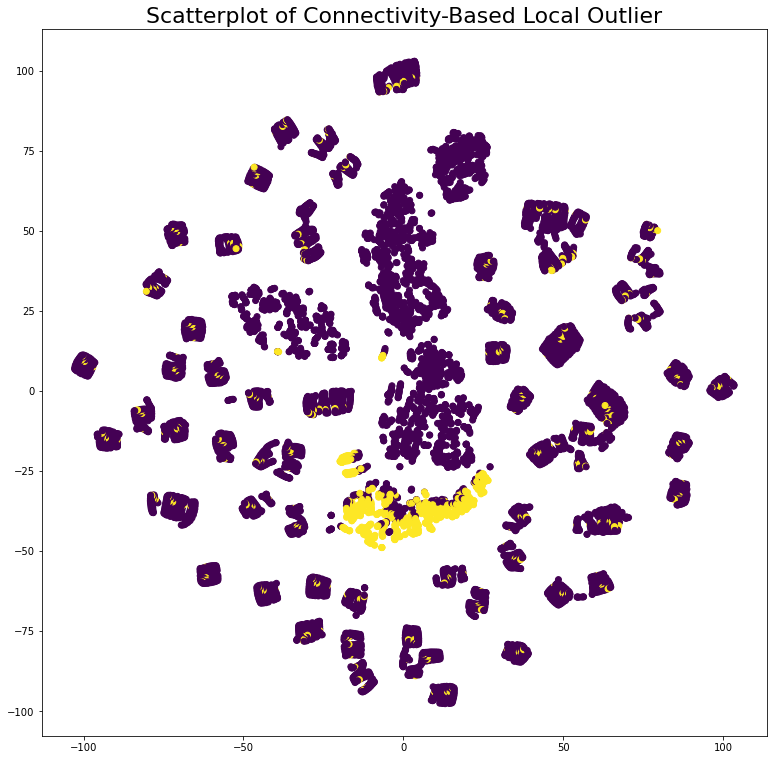

In [61]:
plt.figure(figsize=(13, 13))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=cluster_results['Anomaly'])
plt.title("Scatterplot of Connectivity-Based Local Outlier", fontsize=22)

## 3.5 Histogram-based Outlier Detection
[Содержание](#Содержание)

In [62]:
# train model abod
histogram = create_model('histogram', fraction = 0.1)
histogram_results = assign_model(histogram)

In [63]:
result_score['histogram_an'] = histogram_results['Anomaly']
result_score['histogram_an_sc'] = histogram_results['Anomaly_Score']
result_score

,iforest_an,iforest_an_sc,abod_an,abod_an_sc,cluster_an,cluster_an_sc,cof_an,cof_an_sc,histogram_an,histogram_an_sc
DT,,,,,,,,,,
2019-06-27 06:40:00,0,-0.058549,1,-0.001079,0,1650.015503,0,1.053664,0,-64.622197
2019-06-27 06:45:00,0,-0.041751,0,-0.005680,0,1350.018555,0,1.047839,0,-64.620493
2019-06-27 06:50:00,0,-0.042139,1,-0.000992,0,1050.023315,0,1.051901,0,-64.620493
2019-06-27 06:55:00,0,-0.053553,1,-0.001062,0,750.031738,0,1.045006,0,-64.620493
2019-06-27 07:00:00,0,-0.036183,1,-0.000991,0,450.038269,0,1.061451,0,-64.816782
...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,1,0.065181,0,-0.003459,0,891.844727,0,1.005982,1,-43.424629
2019-07-31 23:40:00,1,0.055687,0,-0.004642,0,591.878052,0,1.004103,1,-43.675649
2019-07-31 23:45:00,1,0.056535,0,-0.003130,0,291.999573,0,0.974309,1,-43.584892


Text(0.5, 1.0, 'Histogram-based Outlier Detection')

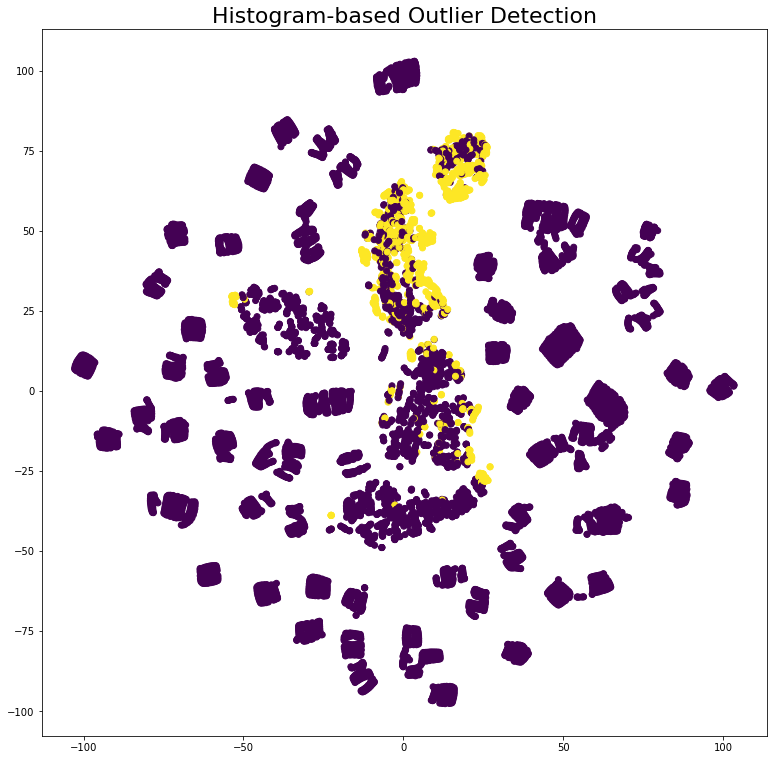

In [64]:
plt.figure(figsize=(13, 13))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=histogram_results['Anomaly'])
plt.title("Histogram-based Outlier Detection", fontsize=22)

## 3.6 K-Nearest Neighbors Detector
[Содержание](#Содержание)

In [65]:
# train model abod
knn = create_model('knn', fraction = 0.1)
knn_results = assign_model(knn)

In [66]:
result_score['knn_an'] = knn_results['Anomaly']
result_score['knn_an_sc'] = knn_results['Anomaly_Score']
result_score

,iforest_an,iforest_an_sc,abod_an,abod_an_sc,cluster_an,cluster_an_sc,cof_an,cof_an_sc,histogram_an,histogram_an_sc,knn_an,knn_an_sc
DT,,,,,,,,,,,,
2019-06-27 06:40:00,0,-0.058549,1,-0.001079,0,1650.015503,0,1.053664,0,-64.622197,0,1.422342
2019-06-27 06:45:00,0,-0.041751,0,-0.005680,0,1350.018555,0,1.047839,0,-64.620493,0,1.424529
2019-06-27 06:50:00,0,-0.042139,1,-0.000992,0,1050.023315,0,1.051901,0,-64.620493,0,1.422194
2019-06-27 06:55:00,0,-0.053553,1,-0.001062,0,750.031738,0,1.045006,0,-64.620493,0,1.422179
2019-06-27 07:00:00,0,-0.036183,1,-0.000991,0,450.038269,0,1.061451,0,-64.816782,0,1.421891
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,1,0.065181,0,-0.003459,0,891.844727,0,1.005982,1,-43.424629,1,2.016598
2019-07-31 23:40:00,1,0.055687,0,-0.004642,0,591.878052,0,1.004103,1,-43.675649,1,2.041446
2019-07-31 23:45:00,1,0.056535,0,-0.003130,0,291.999573,0,0.974309,1,-43.584892,1,2.022304


Text(0.5, 1.0, 'Scatterplot of K-Nearest Neighbors Detector')

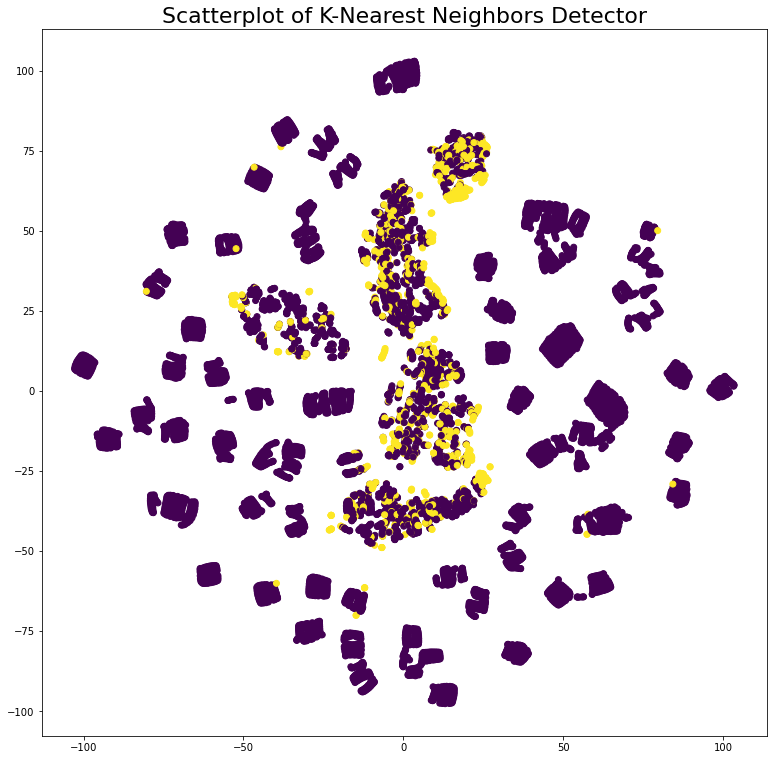

In [67]:
plt.figure(figsize=(13, 13))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=knn_results['Anomaly'])
plt.title("Scatterplot of K-Nearest Neighbors Detector", fontsize=22)

## 3.7 Local Outlier Factor
[Содержание](#Содержание)

The Local Outlier Factor (LOF) algorithm is an unsupervised anomaly detection method which computes the local density deviation of a given data point with respect to its neighbors. It considers as outliers the samples that have a substantially lower density than their neighbors

In [68]:
# train model abod
lof = create_model('lof', fraction = 0.1)
lof_results = assign_model(lof)

In [69]:
result_score['lof_an'] = lof_results['Anomaly']
result_score['lof_an_sc'] = lof_results['Anomaly_Score']
result_score

,iforest_an,iforest_an_sc,abod_an,abod_an_sc,cluster_an,cluster_an_sc,cof_an,cof_an_sc,histogram_an,histogram_an_sc,knn_an,knn_an_sc,lof_an,lof_an_sc
DT,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,-0.058549,1,-0.001079,0,1650.015503,0,1.053664,0,-64.622197,0,1.422342,0,1.001379
2019-06-27 06:45:00,0,-0.041751,0,-0.005680,0,1350.018555,0,1.047839,0,-64.620493,0,1.424529,0,1.002049
2019-06-27 06:50:00,0,-0.042139,1,-0.000992,0,1050.023315,0,1.051901,0,-64.620493,0,1.422194,0,1.001292
2019-06-27 06:55:00,0,-0.053553,1,-0.001062,0,750.031738,0,1.045006,0,-64.620493,0,1.422179,0,1.001183
2019-06-27 07:00:00,0,-0.036183,1,-0.000991,0,450.038269,0,1.061451,0,-64.816782,0,1.421891,1,1.056479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,1,0.065181,0,-0.003459,0,891.844727,0,1.005982,1,-43.424629,1,2.016598,0,1.008193
2019-07-31 23:40:00,1,0.055687,0,-0.004642,0,591.878052,0,1.004103,1,-43.675649,1,2.041446,0,0.982024
2019-07-31 23:45:00,1,0.056535,0,-0.003130,0,291.999573,0,0.974309,1,-43.584892,1,2.022304,0,0.982762


Text(0.5, 1.0, 'Scatterplot of Local Outlier Factor')

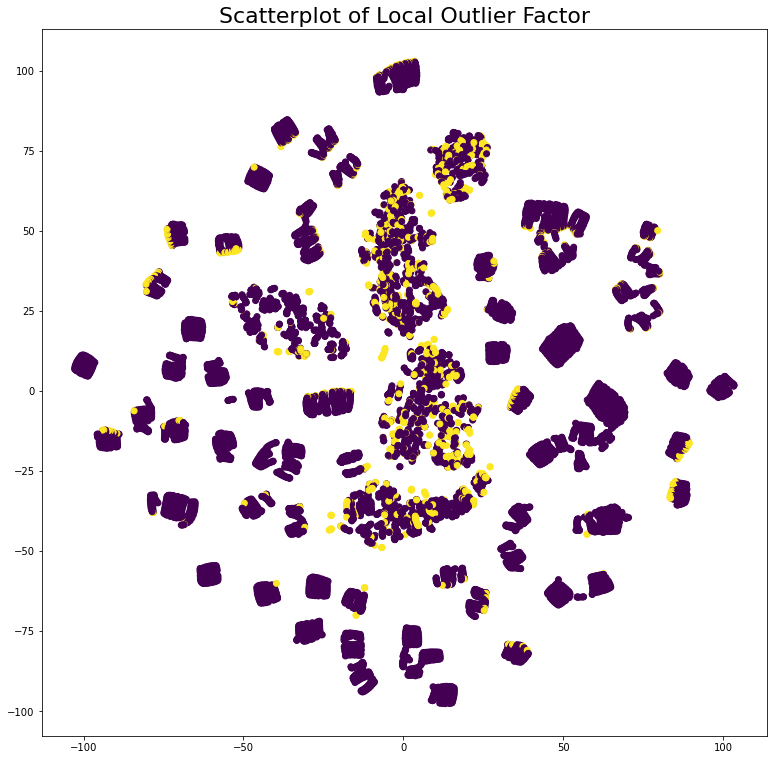

In [70]:
plt.figure(figsize=(13, 13))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=lof_results['Anomaly'])
plt.title("Scatterplot of Local Outlier Factor", fontsize=22)

## 3.8 One-class SVM detector
[Содержание](#Содержание)

Коротко о Support Vector Machine

SVM - базовая линейная модель. Основная идея алгоритма (в случае с классификацией) - разделить классы гиперплоскостью так, чтобы максимизировать расстояние (зазор) между ними. Изначально алгоритм был способен работать только с линейно разделимыми классами, однако в 90-е годы прошлого века метод стал особенно популярен из-за внедрения "Kernel Trick" (1992), позволившего эффективно работать с линейно неразделимыми данными.

Kernel Trick

Ядро (kernel) - это функция, которая способна преобразовать признаковое пространство (в том числе нелинейно), без непосредственного преобразования признаков.

Крайне эффективна в плане вычисления и потенциально позволяет получать бесконечноразмерные признаковые пространства.

Идея заключается в том, что классы, линейно неразделимые в текущем признаковом пространстве, могут стать разделимыми в пространствах более высокой размерности:

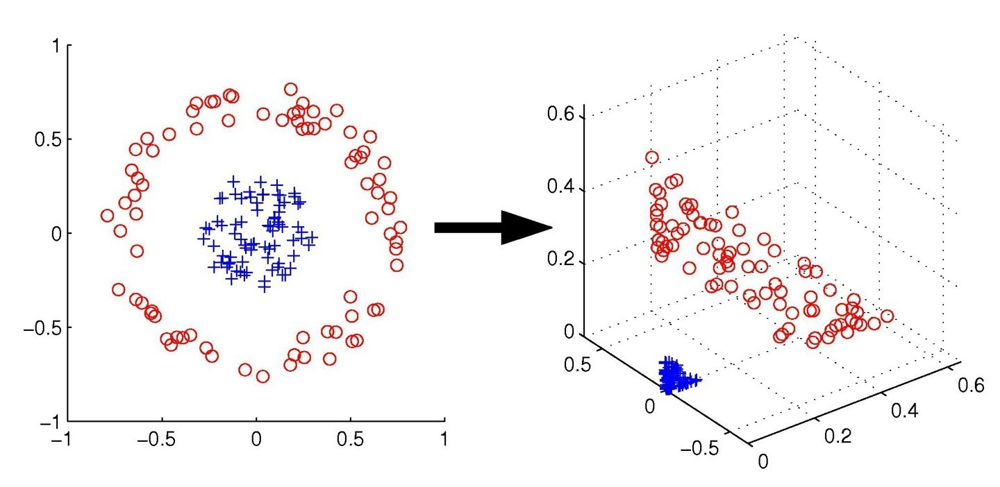

One Class SVM - это одна из форм классического алгоритма, однако, как следует из названия, для его обучения нам достаточно иметь всего один класс, пусть даже и немного "зашумленный", при этом мы хотим научиться для каждого нового наблюдения принимать решение, является ли оно аномальным или нет.

Общая идея: преобразовать признаковое пространство и провести разделяющую гиперплоскость так, чтобы наблюдения лежали как можно дальше от начала координат:

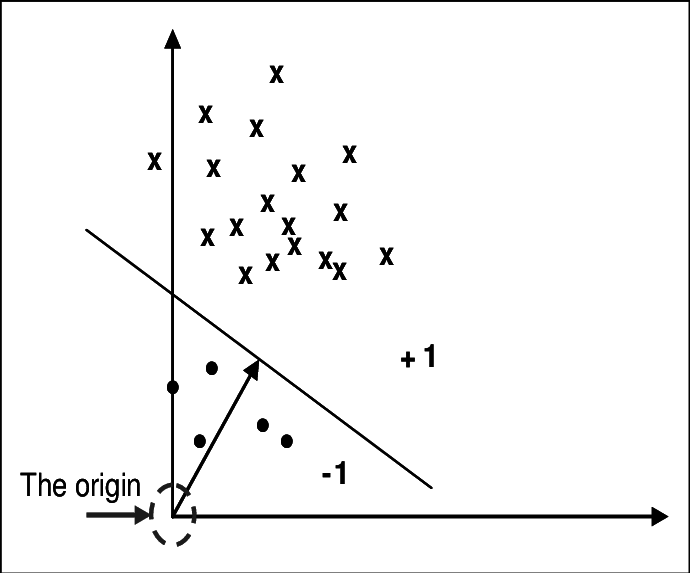

В результате мы получаем границу, по одну сторону которой лежат максимально "плотные" и похожие друг на друга наблюдения из нашей тренировочной выборки, а по другую будут находится аномальные значения, не похожие на все остальные. 

In [71]:
# train model SVM
svm = create_model('svm', fraction = 0.1)
svm_results = assign_model(svm)

In [72]:
result_score['svm_an'] = svm_results['Anomaly']
result_score['svm_an_sc'] = svm_results['Anomaly_Score']
result_score

,iforest_an,iforest_an_sc,abod_an,abod_an_sc,cluster_an,cluster_an_sc,cof_an,cof_an_sc,histogram_an,histogram_an_sc,knn_an,knn_an_sc,lof_an,lof_an_sc,svm_an,svm_an_sc
DT,,,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,-0.058549,1,-0.001079,0,1650.015503,0,1.053664,0,-64.622197,0,1.422342,0,1.001379,0,0.009277
2019-06-27 06:45:00,0,-0.041751,0,-0.005680,0,1350.018555,0,1.047839,0,-64.620493,0,1.424529,0,1.002049,0,0.014194
2019-06-27 06:50:00,0,-0.042139,1,-0.000992,0,1050.023315,0,1.051901,0,-64.620493,0,1.422194,0,1.001292,0,0.009042
2019-06-27 06:55:00,0,-0.053553,1,-0.001062,0,750.031738,0,1.045006,0,-64.620493,0,1.422179,0,1.001183,0,0.008520
2019-06-27 07:00:00,0,-0.036183,1,-0.000991,0,450.038269,0,1.061451,0,-64.816782,0,1.421891,1,1.056479,0,0.007538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,1,0.065181,0,-0.003459,0,891.844727,0,1.005982,1,-43.424629,1,2.016598,0,1.008193,0,0.073329
2019-07-31 23:40:00,1,0.055687,0,-0.004642,0,591.878052,0,1.004103,1,-43.675649,1,2.041446,0,0.982024,0,-0.000386
2019-07-31 23:45:00,1,0.056535,0,-0.003130,0,291.999573,0,0.974309,1,-43.584892,1,2.022304,0,0.982762,0,0.021601


Text(0.5, 1.0, 'Scatterplot of SVM Anomaly Score')

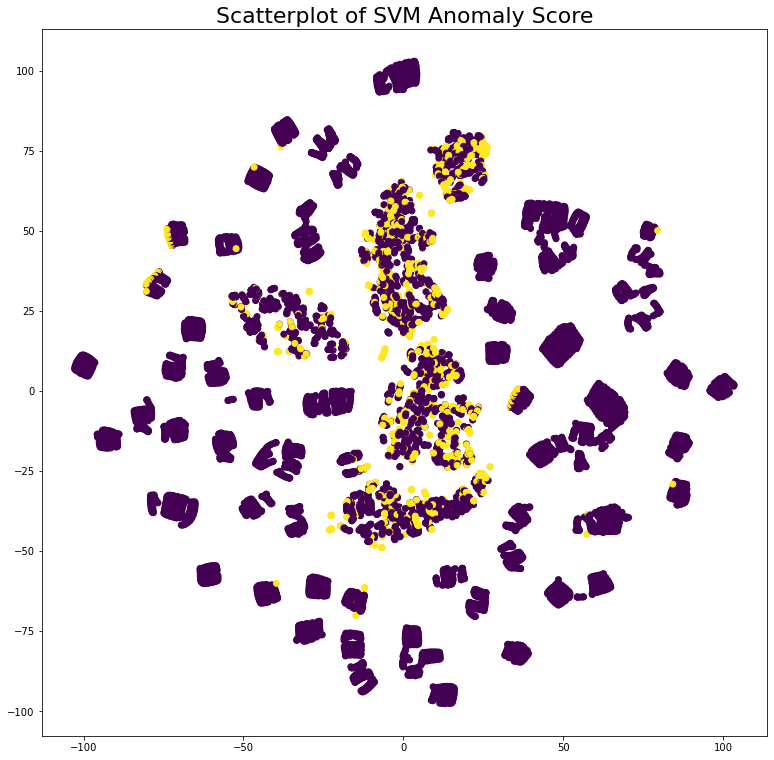

In [73]:
plt.figure(figsize=(13, 13))
# plt.figure(figsize=(10, 10))

plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=svm_results['Anomaly'])
plt.title("Scatterplot of SVM Anomaly Score", fontsize=22)

## 3.9 Principal Component Analysis
[Содержание](#Содержание)

Данный метод аппроксимирует n-размерное облако наблюдений при помощи SVD-разложения матриц до эллипсоида (тоже n-мерного), полуоси которого и будут являться будущими главными компонентами. И при проекции на такие оси (снижении размерности) сохраняется наибольшее количество информации.

Плюсы:
 -  простой непараметрический метод, позволяет снижать размерность данных, и тем самым обнаружить возможные упрощенные структуры, лежащие в основе рассматриваемого датасета

Минусы:
 - PCA (как и другие классические методы редукции многомерных данных) ищет только линейные зависимости
 
 [A Tutorial on Principal Component Analysis//Jonathon Shlens//Google Research//Dated: April 7, 2014]

In [74]:
# train model PCA
pca = create_model('pca', fraction = 0.1)
pca_results = assign_model(pca)

In [75]:
result_score['pca_an'] = pca_results['Anomaly']
result_score['pca_an_sc'] = pca_results['Anomaly_Score']
result_score

,iforest_an,iforest_an_sc,abod_an,abod_an_sc,cluster_an,cluster_an_sc,cof_an,cof_an_sc,histogram_an,histogram_an_sc,knn_an,knn_an_sc,lof_an,lof_an_sc,svm_an,svm_an_sc,pca_an,pca_an_sc
DT,,,,,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,-0.058549,1,-0.001079,0,1650.015503,0,1.053664,0,-64.622197,0,1.422342,0,1.001379,0,0.009277,0,1.459375e+16
2019-06-27 06:45:00,0,-0.041751,0,-0.005680,0,1350.018555,0,1.047839,0,-64.620493,0,1.424529,0,1.002049,0,0.014194,0,1.529677e+16
2019-06-27 06:50:00,0,-0.042139,1,-0.000992,0,1050.023315,0,1.051901,0,-64.620493,0,1.422194,0,1.001292,0,0.009042,0,1.463493e+16
2019-06-27 06:55:00,0,-0.053553,1,-0.001062,0,750.031738,0,1.045006,0,-64.620493,0,1.422179,0,1.001183,0,0.008520,0,1.461226e+16
2019-06-27 07:00:00,0,-0.036183,1,-0.000991,0,450.038269,0,1.061451,0,-64.816782,0,1.421891,1,1.056479,0,0.007538,0,1.446551e+16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,1,0.065181,0,-0.003459,0,891.844727,0,1.005982,1,-43.424629,1,2.016598,0,1.008193,0,0.073329,1,2.310664e+16
2019-07-31 23:40:00,1,0.055687,0,-0.004642,0,591.878052,0,1.004103,1,-43.675649,1,2.041446,0,0.982024,0,-0.000386,1,2.245967e+16
2019-07-31 23:45:00,1,0.056535,0,-0.003130,0,291.999573,0,0.974309,1,-43.584892,1,2.022304,0,0.982762,0,0.021601,1,2.210243e+16


Text(0.5, 1.0, 'Scatterplot of Principal Component Analysis')

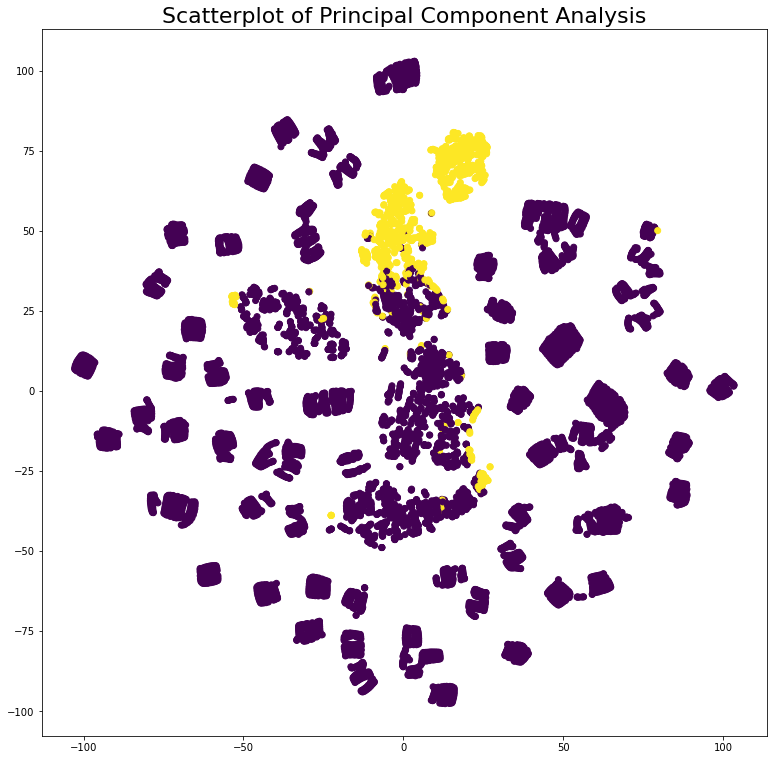

In [76]:
plt.figure(figsize=(13, 13))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=pca_results['Anomaly'])
plt.title("Scatterplot of Principal Component Analysis", fontsize=22)

## 3.10 Minimum Covariance Determinant
[Содержание](#Содержание)

In [77]:
# train model MCD
mcd = create_model('mcd', fraction = 0.1)
mcd_results = assign_model(mcd)

In [78]:
result_score['mcd_an'] = mcd_results['Anomaly']
result_score['mcd_an_sc'] = mcd_results['Anomaly_Score']
result_score

,iforest_an,iforest_an_sc,abod_an,abod_an_sc,cluster_an,cluster_an_sc,cof_an,cof_an_sc,histogram_an,histogram_an_sc,knn_an,knn_an_sc,lof_an,lof_an_sc,svm_an,svm_an_sc,pca_an,pca_an_sc,mcd_an,mcd_an_sc
DT,,,,,,,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,-0.058549,1,-0.001079,0,1650.015503,0,1.053664,0,-64.622197,0,1.422342,0,1.001379,0,0.009277,0,1.459375e+16,0,33.404298
2019-06-27 06:45:00,0,-0.041751,0,-0.005680,0,1350.018555,0,1.047839,0,-64.620493,0,1.424529,0,1.002049,0,0.014194,0,1.529677e+16,0,47.113369
2019-06-27 06:50:00,0,-0.042139,1,-0.000992,0,1050.023315,0,1.051901,0,-64.620493,0,1.422194,0,1.001292,0,0.009042,0,1.463493e+16,0,33.427411
2019-06-27 06:55:00,0,-0.053553,1,-0.001062,0,750.031738,0,1.045006,0,-64.620493,0,1.422179,0,1.001183,0,0.008520,0,1.461226e+16,0,33.370050
2019-06-27 07:00:00,0,-0.036183,1,-0.000991,0,450.038269,0,1.061451,0,-64.816782,0,1.421891,1,1.056479,0,0.007538,0,1.446551e+16,0,32.723713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,1,0.065181,0,-0.003459,0,891.844727,0,1.005982,1,-43.424629,1,2.016598,0,1.008193,0,0.073329,1,2.310664e+16,1,577.832652
2019-07-31 23:40:00,1,0.055687,0,-0.004642,0,591.878052,0,1.004103,1,-43.675649,1,2.041446,0,0.982024,0,-0.000386,1,2.245967e+16,1,556.348413
2019-07-31 23:45:00,1,0.056535,0,-0.003130,0,291.999573,0,0.974309,1,-43.584892,1,2.022304,0,0.982762,0,0.021601,1,2.210243e+16,1,580.587162


Text(0.5, 1.0, 'Scatterplot of Minimum Covariance Determinant')

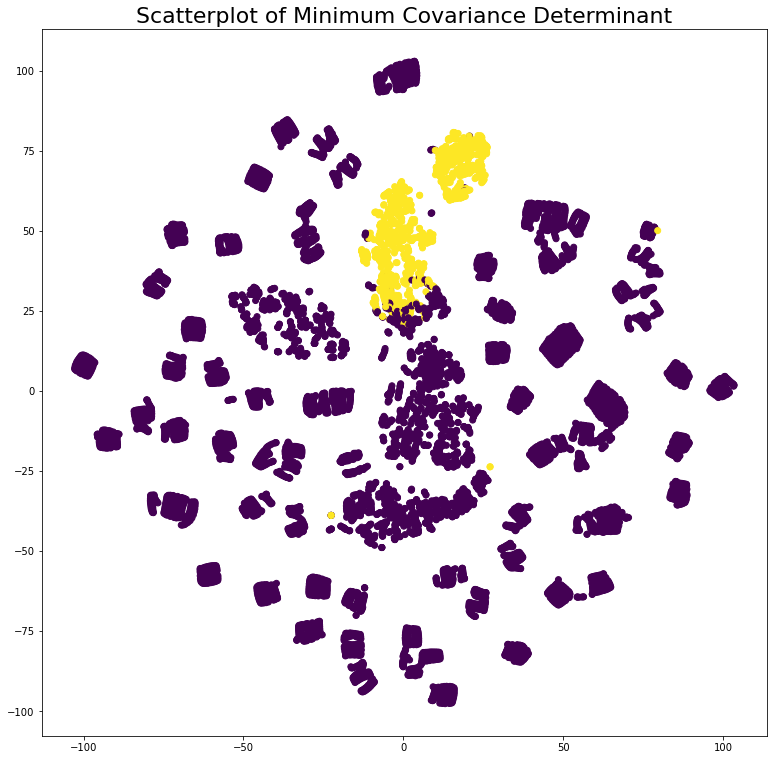

In [79]:
plt.figure(figsize=(13, 13))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=mcd_results['Anomaly'])
plt.title("Scatterplot of Minimum Covariance Determinant", fontsize=22)

## 3.11 Subspace Outlier Detection
[Содержание](#Содержание)

Общая идея - найти множество референсных точек, например, ближайших соседей. Используя подмножество признаков создать гиперплоскость вдоль которой лежит максимальное количество признаков. И затем посмотреть как далеко лежит от этой плоскости лежит наша точка. 

[Outlier Detection in Axis-Parallel Subspaces of
High Dimensional Data//Hans-Peter Kriegel, Peer Kr¨oger, Erich Schubert, and Arthur Zimek//Ludwig-Maximilians-Universit¨at M¨unchen]

or any given point, find a set of reference points, for example the nearest neighbors. Using a subset of the features, create a hyperplane along which the variance of the reference points is high. Then see how far from this hyperplane the point of interest is.

To put it another way, find the stable features for the reference points, then measure how far away the point of interest is from the reference points in these stable features. In the following image, SOD finds the green hyperplane (line), and measures the distance between the red point and the line to determine whether a point is an outlier.

In [80]:
%%time
# train model SOD
sod = create_model('sod', fraction = 0.1)
sod_results = assign_model(sod)

Wall time: 50.1 s


In [81]:
result_score['sod_an'] = sod_results['Anomaly']
result_score['sod_an_sc'] = sod_results['Anomaly_Score']
result_score

,iforest_an,iforest_an_sc,abod_an,abod_an_sc,cluster_an,cluster_an_sc,cof_an,cof_an_sc,histogram_an,histogram_an_sc,...,lof_an,lof_an_sc,svm_an,svm_an_sc,pca_an,pca_an_sc,mcd_an,mcd_an_sc,sod_an,sod_an_sc
DT,,,,,,,,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,-0.058549,1,-0.001079,0,1650.015503,0,1.053664,0,-64.622197,...,0,1.001379,0,0.009277,0,1.459375e+16,0,33.404298,0,0.199250
2019-06-27 06:45:00,0,-0.041751,0,-0.005680,0,1350.018555,0,1.047839,0,-64.620493,...,0,1.002049,0,0.014194,0,1.529677e+16,0,47.113369,0,0.196073
2019-06-27 06:50:00,0,-0.042139,1,-0.000992,0,1050.023315,0,1.051901,0,-64.620493,...,0,1.001292,0,0.009042,0,1.463493e+16,0,33.427411,0,0.198749
2019-06-27 06:55:00,0,-0.053553,1,-0.001062,0,750.031738,0,1.045006,0,-64.620493,...,0,1.001183,0,0.008520,0,1.461226e+16,0,33.370050,0,0.199061
2019-06-27 07:00:00,0,-0.036183,1,-0.000991,0,450.038269,0,1.061451,0,-64.816782,...,1,1.056479,0,0.007538,0,1.446551e+16,0,32.723713,0,0.206589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,1,0.065181,0,-0.003459,0,891.844727,0,1.005982,1,-43.424629,...,0,1.008193,0,0.073329,1,2.310664e+16,1,577.832652,1,0.211098
2019-07-31 23:40:00,1,0.055687,0,-0.004642,0,591.878052,0,1.004103,1,-43.675649,...,0,0.982024,0,-0.000386,1,2.245967e+16,1,556.348413,1,0.220208
2019-07-31 23:45:00,1,0.056535,0,-0.003130,0,291.999573,0,0.974309,1,-43.584892,...,0,0.982762,0,0.021601,1,2.210243e+16,1,580.587162,0,0.131409


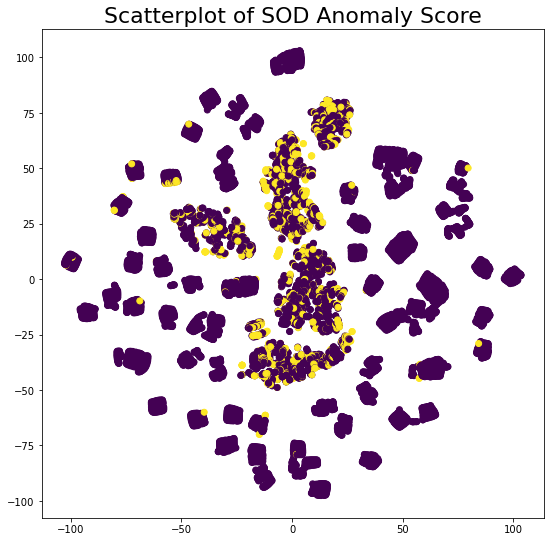

In [82]:
# plt.figure(figsize=(13, 13))
plt.figure(figsize=(9, 9))

plt.title("Scatterplot of SOD Anomaly Score", fontsize=22)
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=sod_results['Anomaly']);
plt.savefig('Scatterplot of SOD Anomaly Score.png')


In [83]:
plt.figure(figsize=(13, 13))
plt.scatter??

<Figure size 936x936 with 0 Axes>

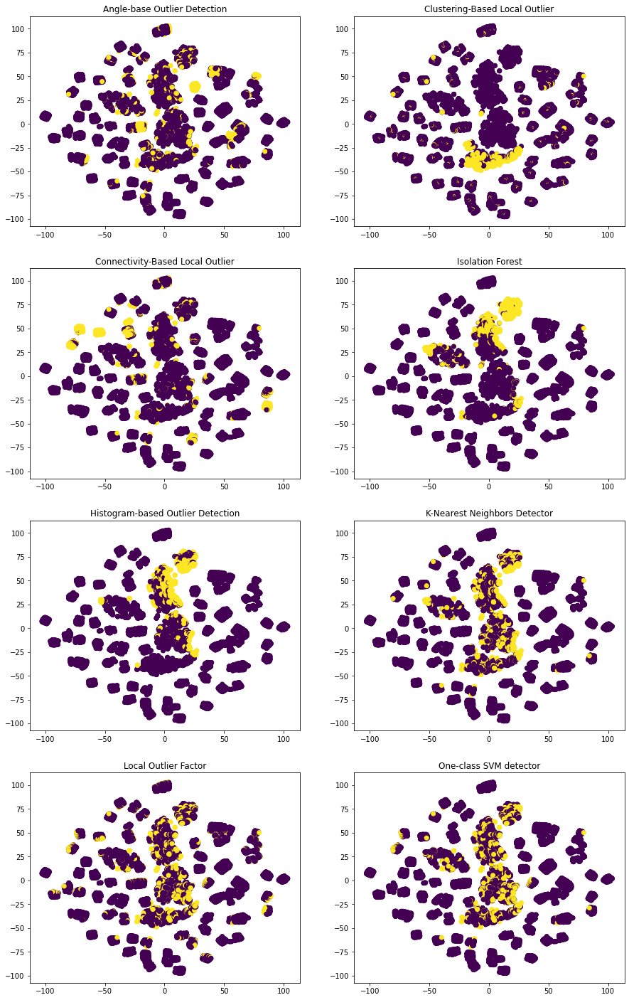

In [84]:
#Loading Dataset

fig , ax = plt.subplots(nrows = 4, ncols = 2, figsize=(15,25))

#Plotting on the 1st axes
ax[0][0].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=abod_results['Anomaly'])
ax[0][0].title.set_text('Angle-base Outlier Detection')


#Plotting on the 1st axes
ax[0][1].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=cluster_results['Anomaly'])
ax[0][1].title.set_text('Clustering-Based Local Outlier')


#Plotting on the 2st axes
ax[1][0].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=cof_results['Anomaly'])
ax[1][0].title.set_text('Connectivity-Based Local Outlier')


#Plotting on the 2st axes
ax[1][1].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=iforest_results['Anomaly'])
ax[1][1].title.set_text('Isolation Forest')


#Plotting on the 3d axes
ax[2][0].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=histogram_results['Anomaly'])
ax[2][0].title.set_text('Histogram-based Outlier Detection')


#Plotting on the 3d axes
ax[2][1].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=knn_results['Anomaly'])
ax[2][1].title.set_text('K-Nearest Neighbors Detector')


#Plotting on the 4th axes
ax[3][0].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=lof_results['Anomaly'])
ax[3][0].title.set_text('Local Outlier Factor')


#Plotting on the 4th axes
ax[3][1].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=svm_results['Anomaly'])
ax[3][1].title.set_text('One-class SVM detector')




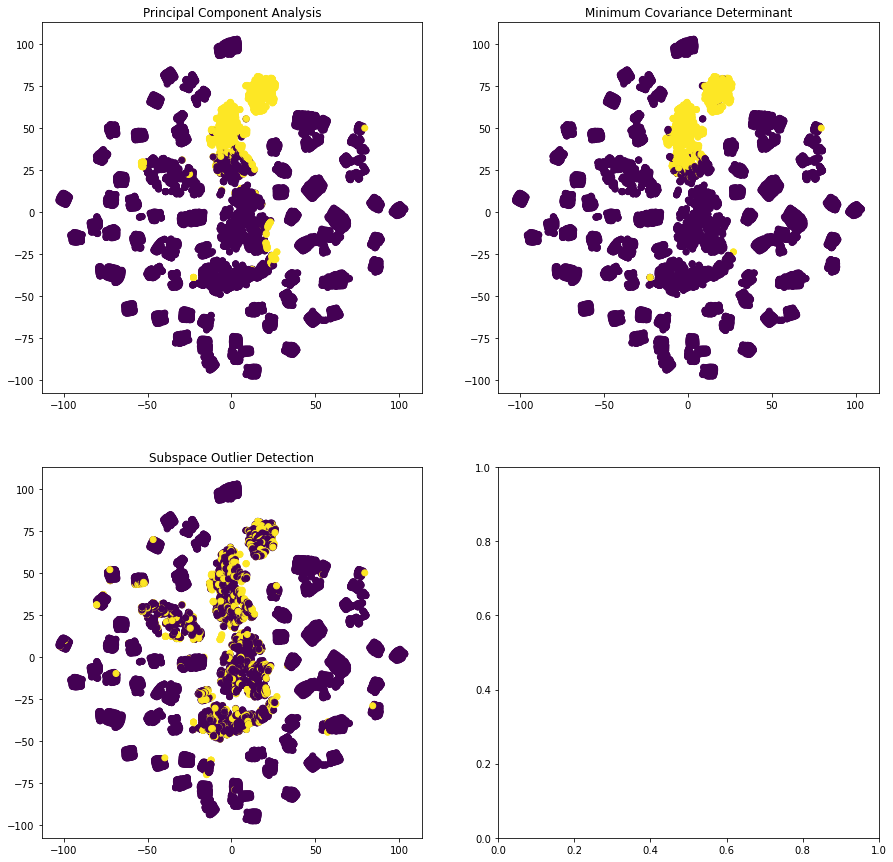

In [85]:
fig , ax = plt.subplots(nrows = 2, ncols = 2, figsize=(15,15))

#Plotting on the 1st axes
ax[0][0].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=pca_results['Anomaly'])
ax[0][0].title.set_text('Principal Component Analysis')


#Plotting on the 1st axes
ax[0][1].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=mcd_results['Anomaly'])
ax[0][1].title.set_text('Minimum Covariance Determinant')


#Plotting on the 2nd axes
ax[1][0].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=sod_results['Anomaly'])
ax[1][0].title.set_text('Subspace Outlier Detection')

# #Plotting on the 2st axes
# ax[4][0].scatter(X_tsne[:, 0],X_tsne[:, 1] , c=soы_results['Anomaly'])

## 3.12 Stochastic Outlier Selection
[Содержание](#Содержание)

In [86]:
# %%time
# # train model SOS
# sos = create_model('sos', fraction = 0.1)
# sos_results = assign_model(sos)

In [87]:
# result_score['sos_an'] = sos_results['Anomaly']
# result_score['sos_an_sc'] = sos_results['Anomaly_Score']
# result_score

In [88]:
# plt.figure(figsize=(13, 13))
# # plt.figure(figsize=(9, 9))

# plt.title("Scatterplot of SOS Anomaly Score", fontsize=22)
# plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=sos_results['Anomaly']);


# 4. Сравнение моделей
[Содержание](#Содержание)

In [89]:
result_score

,iforest_an,iforest_an_sc,abod_an,abod_an_sc,cluster_an,cluster_an_sc,cof_an,cof_an_sc,histogram_an,histogram_an_sc,...,lof_an,lof_an_sc,svm_an,svm_an_sc,pca_an,pca_an_sc,mcd_an,mcd_an_sc,sod_an,sod_an_sc
DT,,,,,,,,,,,,,,,,,,,,,
2019-06-27 06:40:00,0,-0.058549,1,-0.001079,0,1650.015503,0,1.053664,0,-64.622197,...,0,1.001379,0,0.009277,0,1.459375e+16,0,33.404298,0,0.199250
2019-06-27 06:45:00,0,-0.041751,0,-0.005680,0,1350.018555,0,1.047839,0,-64.620493,...,0,1.002049,0,0.014194,0,1.529677e+16,0,47.113369,0,0.196073
2019-06-27 06:50:00,0,-0.042139,1,-0.000992,0,1050.023315,0,1.051901,0,-64.620493,...,0,1.001292,0,0.009042,0,1.463493e+16,0,33.427411,0,0.198749
2019-06-27 06:55:00,0,-0.053553,1,-0.001062,0,750.031738,0,1.045006,0,-64.620493,...,0,1.001183,0,0.008520,0,1.461226e+16,0,33.370050,0,0.199061
2019-06-27 07:00:00,0,-0.036183,1,-0.000991,0,450.038269,0,1.061451,0,-64.816782,...,1,1.056479,0,0.007538,0,1.446551e+16,0,32.723713,0,0.206589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,1,0.065181,0,-0.003459,0,891.844727,0,1.005982,1,-43.424629,...,0,1.008193,0,0.073329,1,2.310664e+16,1,577.832652,1,0.211098
2019-07-31 23:40:00,1,0.055687,0,-0.004642,0,591.878052,0,1.004103,1,-43.675649,...,0,0.982024,0,-0.000386,1,2.245967e+16,1,556.348413,1,0.220208
2019-07-31 23:45:00,1,0.056535,0,-0.003130,0,291.999573,0,0.974309,1,-43.584892,...,0,0.982762,0,0.021601,1,2.210243e+16,1,580.587162,0,0.131409


In [90]:
result_predict =  result_score.copy()
result_predict = result_predict.loc[:, 'iforest_an'::2]
result_predict

,iforest_an,abod_an,cluster_an,cof_an,histogram_an,knn_an,lof_an,svm_an,pca_an,mcd_an,sod_an
DT,,,,,,,,,,,
2019-06-27 06:40:00,0,1,0,0,0,0,0,0,0,0,0
2019-06-27 06:45:00,0,0,0,0,0,0,0,0,0,0,0
2019-06-27 06:50:00,0,1,0,0,0,0,0,0,0,0,0
2019-06-27 06:55:00,0,1,0,0,0,0,0,0,0,0,0
2019-06-27 07:00:00,0,1,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,1,0,0,0,1,1,0,0,1,1,1
2019-07-31 23:40:00,1,0,0,0,1,1,0,0,1,1,1
2019-07-31 23:45:00,1,0,0,0,1,1,0,0,1,1,0


,0
0,5521
1,2245
2,653
3,453
4,392
5,269
6,185
7,120
8,75
9,43


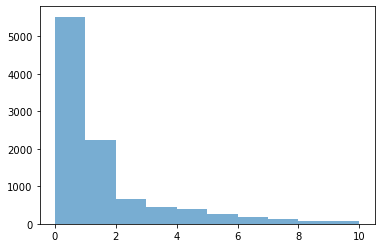

In [91]:
outliers_score_model_based = result_predict.sum(axis=1)
plt.hist(outliers_score_model_based, alpha=0.6);
outliers_score_model_based = pd.DataFrame(outliers_score_model_based.value_counts())
outliers_score_model_based

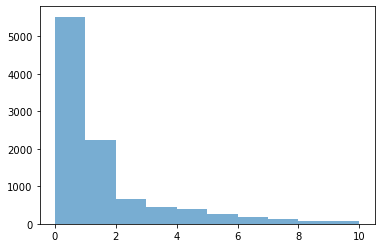

In [92]:
outliers_score = result_predict.sum(axis=1)
plt.hist(outliers_score, alpha=0.6);


<AxesSubplot:>

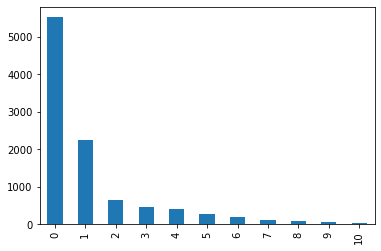

In [93]:
outliers_score.value_counts().plot(kind='bar')


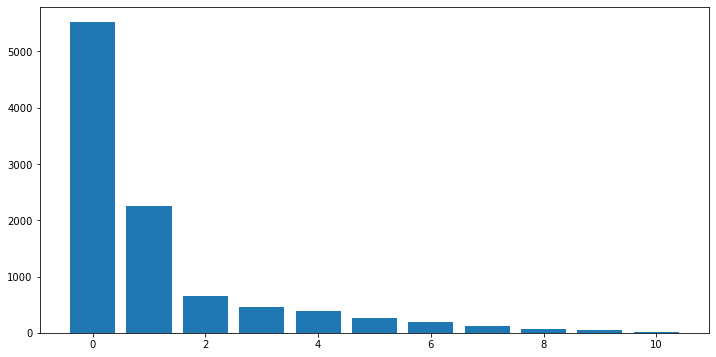

In [94]:
x = np.arange(0, 11)
y = outliers_score.value_counts()

fig, ax = plt.subplots()

ax.bar(x, y)

# ax.set_facecolor('seashell')
# fig.set_facecolor('floralwhite')
fig.set_figwidth(12)    #  ширина Figure
fig.set_figheight(6)    #  высота Figure

In [158]:
result_predict['anom_vote'] = np.where(result_predict.sum(axis=1) >= 5, 1,0)
result_predict

,iforest_an,abod_an,cluster_an,cof_an,histogram_an,knn_an,lof_an,svm_an,pca_an,mcd_an,sod_an,anom_vote
DT,,,,,,,,,,,,
2019-06-27 06:40:00,0,1,0,0,0,0,0,0,0,0,0,0
2019-06-27 06:45:00,0,0,0,0,0,0,0,0,0,0,0,0
2019-06-27 06:50:00,0,1,0,0,0,0,0,0,0,0,0,0
2019-06-27 06:55:00,0,1,0,0,0,0,0,0,0,0,0,0
2019-06-27 07:00:00,0,1,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-07-31 23:35:00,1,0,0,0,1,1,0,0,1,1,1,1
2019-07-31 23:40:00,1,0,0,0,1,1,0,0,1,1,1,1
2019-07-31 23:45:00,1,0,0,0,1,1,0,0,1,1,0,1


In [159]:
models_score = pd.DataFrame()

for column in result_predict.columns[:-1]:
            models_score = models_score.append({'well_id': 226000188,
                                                'model_name': column,
                                                'accuracy_score': accuracy_score(result_predict['anom_vote'], result_predict[column]),
                                                'recall_score': recall_score(result_predict['anom_vote'], result_predict[column]),
                                                'f1_score': f1_score(result_predict['anom_vote'], result_predict[column]),
                                                'precision_score': precision_score(result_predict['anom_vote'], result_predict[column])}, ignore_index=True)
models_score

,well_id,model_name,accuracy_score,recall_score,f1_score,precision_score
0,226000188.0,iforest_an,0.932932,0.731364,0.608543,0.521042
1,226000188.0,abod_an,0.876792,0.337553,0.280866,0.240481
2,226000188.0,cluster_an,0.844712,0.092827,0.078525,0.068041
3,226000188.0,cof_an,0.865564,0.258790,0.215331,0.184369
4,226000188.0,histogram_an,0.933935,0.738397,0.614394,0.526052
5,226000188.0,knn_an,0.942356,0.797468,0.663546,0.568136
6,226000188.0,lof_an,0.915890,0.611814,0.509070,0.435872
7,226000188.0,svm_an,0.927519,0.693390,0.576946,0.493988
8,226000188.0,pca_an,0.939950,0.780591,0.649503,0.556112
9,226000188.0,mcd_an,0.925915,0.682138,0.567583,0.485972


In [160]:
models_score.sort_values('f1_score',ascending=False)


,well_id,model_name,accuracy_score,recall_score,f1_score,precision_score
5,226000188.0,knn_an,0.942356,0.797468,0.663546,0.568136
8,226000188.0,pca_an,0.939950,0.780591,0.649503,0.556112
4,226000188.0,histogram_an,0.933935,0.738397,0.614394,0.526052
0,226000188.0,iforest_an,0.932932,0.731364,0.608543,0.521042
7,226000188.0,svm_an,0.927519,0.693390,0.576946,0.493988
9,226000188.0,mcd_an,0.925915,0.682138,0.567583,0.485972
6,226000188.0,lof_an,0.915890,0.611814,0.509070,0.435872
10,226000188.0,sod_an,0.909273,0.565401,0.470451,0.402806
1,226000188.0,abod_an,0.876792,0.337553,0.280866,0.240481
3,226000188.0,cof_an,0.865564,0.258790,0.215331,0.184369


In [161]:
def highlight_max(s):
    if s.dtype == np.object:
        is_max = [False for _ in range(s.shape[0])]
    else:
        is_max = s == s.max()
    return ['background: lightgreen' if cell else '' for cell in is_max]
  
models_score.style.apply(highlight_max)

,well_id,model_name,accuracy_score,recall_score,f1_score,precision_score
0,226000188.000000,iforest_an,0.932932,0.731364,0.608543,0.521042
1,226000188.000000,abod_an,0.876792,0.337553,0.280866,0.240481
2,226000188.000000,cluster_an,0.844712,0.092827,0.078525,0.068041
3,226000188.000000,cof_an,0.865564,0.258790,0.215331,0.184369
4,226000188.000000,histogram_an,0.933935,0.738397,0.614394,0.526052
5,226000188.000000,knn_an,0.942356,0.797468,0.663546,0.568136
6,226000188.000000,lof_an,0.915890,0.611814,0.509070,0.435872
7,226000188.000000,svm_an,0.927519,0.693390,0.576946,0.493988
8,226000188.000000,pca_an,0.939950,0.780591,0.649503,0.556112
9,226000188.000000,mcd_an,0.925915,0.682138,0.567583,0.485972


In [162]:
models_score.accuracy_score.idxmax()

5

In [163]:
models_score.f1_score.idxmax()

5

In [164]:
plt.scatter??

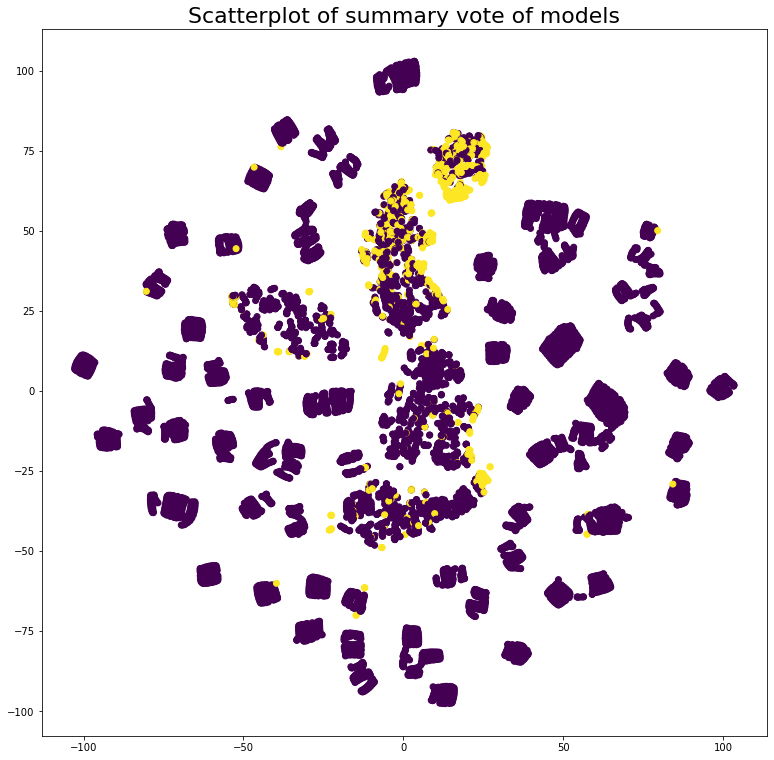

In [165]:
plt.figure(figsize=(13, 13))
plt.title("Scatterplot of summary vote of models", fontsize=22)
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=result_predict['anom_vote'])

In [134]:
import plotly.graph_objects as go
import plotly.express as px

# plot value on y-axis and date on x-axis
fig = px.line(iforest_results, x=iforest_results.index, y="workload_сh_h", title='DATA UNSUPERVISED ANOMALY DETECTION', template = 'plotly_dark')
# create list of outlier_dates
outlier_dates = iforest_results[iforest_results['Anomaly'] == 1].index
# obtain y value of anomalies to plot
y_values = [iforest_results.loc[i]['workload_сh_h'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=10)))
        
fig.show()

In [117]:
# plot value on y-axis and date on x-axis
fig = px.line(iforest_results, x=iforest_results.index, y="engine", title='DATA UNSUPERVISED ANOMALY DETECTION', template = 'plotly_dark')
# create list of outlier_dates
outlier_dates = iforest_results[iforest_results['Anomaly'] == 1].index
# obtain y value of anomalies to plot
y_values = [iforest_results.loc[i]['engine'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=10)))
        
fig.show()

In [121]:
# plot value on y-axis and date on x-axis
fig = px.line(iforest_results, x=iforest_results.index, y="«engine_idle", title='DATA UNSUPERVISED ANOMALY DETECTION', template = 'plotly_dark')
# create list of outlier_dates
outlier_dates = iforest_results[iforest_results['Anomaly'] == 1].index
# obtain y value of anomalies to plot
y_values = [iforest_results.loc[i]['«engine_idle'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=10)))
        
fig.show()

In [122]:
# plot value on y-axis and date on x-axis
fig = px.line(iforest_results, x=iforest_results.index, y="curr_сh_h", title='DATA UNSUPERVISED ANOMALY DETECTION', template = 'plotly_dark')
# create list of outlier_dates
outlier_dates = iforest_results[iforest_results['Anomaly'] == 1].index
# obtain y value of anomalies to plot
y_values = [iforest_results.loc[i]['curr_сh_h'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=10)))
        
fig.show()

In [124]:
# plot value on y-axis and date on x-axis
fig = px.line(iforest_results, x=iforest_results.index, y="press_сh_h»", title='DATA UNSUPERVISED ANOMALY DETECTION', template = 'plotly_dark')
# create list of outlier_dates
outlier_dates = iforest_results[iforest_results['Anomaly'] == 1].index
# obtain y value of anomalies to plot
y_values = [iforest_results.loc[i]['press_сh_h»'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=10)))
        
fig.show()

In [126]:
data_one_id.head(0)

,engine,«engine_idle,workload_сh_d,workload_сh_h,workload_сh_w,curr_сh_d,curr_сh_h,curr_сh_w,press_сh_d»,press_сh_h»,press_сh_w,press_coll,workload_eng,curr,power_coef,hour,day_w,minute
DT,,,,,,,,,,,,,,,,,,


In [135]:
# plot value on y-axis and date on x-axis
fig = px.line(iforest_results, x=iforest_results.index, y="press_coll", title='DATA UNSUPERVISED ANOMALY DETECTION', template = 'plotly_dark')
# create list of outlier_dates
outlier_dates = iforest_results[iforest_results['Anomaly'] == 1].index
# obtain y value of anomalies to plot
y_values = [iforest_results.loc[i]['press_coll'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=10)))
        
fig.show()

In [133]:
# plot value on y-axis and date on x-axis
fig = px.line(iforest_results, x=iforest_results.index, y="workload_eng", title='Загрузка двигателя, %', template = 'plotly_dark')
# create list of outlier_dates
outlier_dates = iforest_results[iforest_results['Anomaly'] == 1].index
# obtain y value of anomalies to plot
y_values = [iforest_results.loc[i]['workload_eng'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=10)))
        
fig.show()

In [130]:
# plot value on y-axis and date on x-axis
fig = px.line(iforest_results, x=iforest_results.index, y="curr", title='DATA UNSUPERVISED ANOMALY DETECTION', template = 'plotly_dark')
# create list of outlier_dates
outlier_dates = iforest_results[iforest_results['Anomaly'] == 1].index
# obtain y value of anomalies to plot
y_values = [iforest_results.loc[i]['curr'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=10)))
        
fig.show()

In [137]:
# plot value on y-axis and date on x-axis
fig = px.line(iforest_results, x=iforest_results.index, y="power_coef", title='Коэффициент мощности (cos fi)', template = 'plotly_dark')
# create list of outlier_dates
outlier_dates = iforest_results[iforest_results['Anomaly'] == 1].index
# obtain y value of anomalies to plot
y_values = [iforest_results.loc[i]['power_coef'] for i in outlier_dates]
fig.add_trace(go.Scatter(x=outlier_dates, y=y_values, mode = 'markers', 
                name = 'Anomaly', 
                marker=dict(color='red',size=10)))
        
fig.show()

## 4.1 Сравнение моделей по другим скважинам
[Содержание](#Содержание)

In [105]:
def score_well(well,data_prep,n_vote):
    
    models_score = pd.DataFrame()

    data_one_id = data_prep.xs(well, level='WELL_ID')
    data_one_id = data_one_id.drop(['targ_press_d','targ_press_h','targ_press_w'],axis=1)

    #Iforest
    iforest = create_model('iforest', fraction = 0.1)
    iforest_results = assign_model(iforest)
    result_score = pd.DataFrame(index = iforest_results.index)
    result_score['iforest_an'] = iforest_results['Anomaly']
    result_score['iforest_an_sc'] = iforest_results['Anomaly_Score']
    
   
    # train model abod
    abod = create_model('abod', fraction = 0.1)
    abod_results = assign_model(abod)
    result_score['abod_an'] = abod_results['Anomaly']
    result_score['abod_an_sc'] = abod_results['Anomaly_Score']
    
    # train model Cluster
    cluster = create_model('cluster', fraction = 0.1)
    cluster_results = assign_model(cluster)
    result_score['cluster_an'] = cluster_results['Anomaly']
    result_score['cluster_an_sc'] = cluster_results['Anomaly_Score']

    # train model cof
    cof = create_model('cof', fraction = 0.1)
    cof_results = assign_model(cof)
    result_score['cof_an'] = cof_results['Anomaly']
    result_score['cof_an_sc'] = cof_results['Anomaly_Score']
    
    # train model hist
    histogram = create_model('histogram', fraction = 0.1)
    histogram_results = assign_model(histogram)
    result_score['histogram_an'] = histogram_results['Anomaly']
    result_score['histogram_an_sc'] = histogram_results['Anomaly_Score']
    
    # train model knn
    knn = create_model('knn', fraction = 0.1)
    knn_results = assign_model(knn)
    result_score['knn_an'] = knn_results['Anomaly']
    result_score['knn_an_sc'] = knn_results['Anomaly_Score']
    
    # train model lof
    lof = create_model('lof', fraction = 0.1)
    lof_results = assign_model(lof)
    result_score['lof_an'] = lof_results['Anomaly']
    result_score['lof_an_sc'] = lof_results['Anomaly_Score']
    
    # train model svm
    svm = create_model('svm', fraction = 0.1)
    svm_results = assign_model(svm)
    
    result_score['svm_an'] = svm_results['Anomaly']
    result_score['svm_an_sc'] = svm_results['Anomaly_Score']
    
    # train model pca
    pca = create_model('pca', fraction = 0.1)
    pca_results = assign_model(pca)
    result_score['pca_an'] = pca_results['Anomaly']
    result_score['pca_an_sc'] = pca_results['Anomaly_Score']


    # train model MCD
    mcd = create_model('mcd', fraction = 0.1)
    mcd_results = assign_model(mcd)
    result_score['mcd_an'] = mcd_results['Anomaly']
    result_score['mcd_an_sc'] = mcd_results['Anomaly_Score']

    # train model sod
    sod = create_model('sod', fraction = 0.1)
    sod_results = assign_model(sod)
    result_score['sod_an'] = sod_results['Anomaly']
    result_score['sod_an_sc'] = sod_results['Anomaly_Score']

#     # train model sos
#     sos = create_model('sos', fraction = 0.1)
#     sos_results = assign_model(sos)
#     result_score['sos_an'] = sos_results['Anomaly']
#     result_score['sos_an_sc'] = sos_results['Anomaly_Score']

    result_predict =  result_score.copy()
    result_predict = result_predict.loc[:, 'iforest_an'::2]
    
    result_predict['anom_vote'] = np.where(result_predict.sum(axis=1) >= n_vote, 1,0)

    
    for column in result_predict.columns[:-1]:
            models_score = models_score.append({'well_id': well,
                                                'model_name': column,
                                                'accuracy_score': accuracy_score(result_predict['anom_vote'], result_predict[column]),
                                                'recall_score': recall_score(result_predict['anom_vote'], result_predict[column]),
                                                'f1_score': f1_score(result_predict['anom_vote'], result_predict[column]),
                                                'precision_score': precision_score(result_predict['anom_vote'], result_predict[column])}, ignore_index=True)


    
    return models_score

In [106]:
well_one = score_well(226003074,data_prep,n_vote=5)


In [107]:
well_one.style.apply(highlight_max)

,well_id,model_name,accuracy_score,recall_score,f1_score,precision_score
0,226003074.000000,iforest_an,0.932932,0.731364,0.608543,0.521042
1,226003074.000000,abod_an,0.876792,0.337553,0.280866,0.240481
2,226003074.000000,cluster_an,0.844712,0.092827,0.078525,0.068041
3,226003074.000000,cof_an,0.865564,0.258790,0.215331,0.184369
4,226003074.000000,histogram_an,0.933935,0.738397,0.614394,0.526052
5,226003074.000000,knn_an,0.942356,0.797468,0.663546,0.568136
6,226003074.000000,lof_an,0.915890,0.611814,0.509070,0.435872
7,226003074.000000,svm_an,0.927519,0.693390,0.576946,0.493988
8,226003074.000000,pca_an,0.939950,0.780591,0.649503,0.556112
9,226003074.000000,mcd_an,0.925915,0.682138,0.567583,0.485972


In [ ]:
%%time
all_wells = pd.concat([score_well(well,data_prep) for well in wells[:]])


In [ ]:
models_all_wells = all_wells.groupby('model_name')['accuracy_score', 'recall_score', 'f1_score', 'precision_score'].mean()


models_all_wells.style.apply(highlight_max) 

In [ ]:
labeled_data = data_one_id.copy()
labeled_data['outlier_score'] = result_predict['anom_vote']

custom_palette = {0:'b', 1:'orange'}

sns.pairplot(data=labeled_data, vars=other_features, 
             hue='outlier_score',
#              markers=['x', 'o'],
#              hue_order=[3, 2, 1, 0],
            hue_order=[1, 0],

             palette=custom_palette
#              palette='bright'

)

## 5. Выводы
[Содержание](#Содержание)

1.	На данных с насосного оборудования, используемого в нефтяной промышленности, были рассмотрены модели поиска аномалий, а также проведен их предварительный сравнительный анализ 
2.	Финальная оценка будет возможна по итогам подтверждения техническим специалистом предполагаемых аномалий
3.	 Лучшими моделями на представленном датасете предварительно показали себя модели:
    a.	Метод KNN (K-Nearest Neighbors Detector)
    b.	SVM (One-class SVM detector)
    c.	PCA (Principal Component Analysis) 
4.	Данные модели, или их ансамбль может заменить стандартный подход поиска аномалии по каждому признаку отдельно по выходящим за интервал 3-сигма значениям
